# Evaluation Project 3: Avocado Project

# Evaluation Project 3: subpart 1

# Avocado Classification Predictive Analysis, Model Development, Model Evaluation and Model Selection Project

# Avocado Project is a classification based problem statement to classify region from several indicators. This dataset utilizes data from weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados

# Importing Data From Github repository dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/avocado.csv.zip

# Importing Required Libraries And Data

In [224]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('avocado.csv',index_col='Date',parse_dates=['Date'])
data=data.sort_index()
data1=pd.read_csv('avocado.csv', index_col=0)
data1=data1.reset_index(drop=True)
data=data.drop('Unnamed: 0', axis=1)
data

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,
2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.00,organic,2015,Southeast
2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.00,organic,2015,Chicago
2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.00,organic,2015,HarrisburgScranton
2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.00,conventional,2015,Pittsburgh
2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.00,organic,2015,Boise
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-25,1.36,908202.13,142681.06,463136.28,174975.75,127409.04,103579.41,22467.04,1362.59,conventional,2018,Chicago
2018-03-25,0.70,9010588.32,3999735.71,966589.50,30130.82,4014132.29,3398569.92,546409.74,69152.63,conventional,2018,SouthCentral
2018-03-25,1.42,163496.70,29253.30,5080.04,0.00,129163.36,109052.26,20111.10,0.00,organic,2018,SouthCentral


# I have created 2 datsets, data1 for timeseries analysis ans anomalies; data for predictive analysis.

In [2]:
len(data['region'].unique())

54

# There are 54 unique values in label.

In [3]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  18249 Number Of Columns:  12


# Data Cleaning

In [4]:
data.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region'],
      dtype='object')

# Checking column names to detect unnamed columns

In [5]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [6]:
data.isna().any()

AveragePrice    False
Total Volume    False
4046            False
4225            False
4770            False
Total Bags      False
Small Bags      False
Large Bags      False
XLarge Bags     False
type            False
year            False
region          False
dtype: bool

In [7]:
data.isna().values.any()

False

In [8]:
data.isnull().values.sum()

0

In [9]:
data.dtypes, len(data.dtypes)

(AveragePrice    float64
 Total Volume    float64
 4046            float64
 4225            float64
 4770            float64
 Total Bags      float64
 Small Bags      float64
 Large Bags      float64
 XLarge Bags     float64
 type             object
 year              int64
 region           object
 dtype: object,
 12)

# Tabulated Conclusion Of Data Cleaning

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18249 entries, 2015-01-04 to 2018-03-25
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   XLarge Bags   18249 non-null  float64
 9   type          18249 non-null  object 
 10  year          18249 non-null  int64  
 11  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(2)
memory usage: 1.8+ MB


# Verbal Translation Of Conclusion Of Above Data Cleaning Process

#### Conclusion:
1. The dataset has no missing values, therefore imputation and filling data are not required.
2. The whole dataset is of 18249*12 shape, hence, chances of overfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 10 continuous columns and 2 categorical columns, hence, encoding is required.

# Exploratory Data Analysis: Priliminary Data Walkthrough The Entire Dataset For Both The Problem Statements

# Logistic View Of TimeSeries

In [11]:
import numpy as np
import cufflinks as cf
cf.set_config_file(offline=True)
data=data.fillna('bfill')
for x in data.select_dtypes(np.number).columns:
    data[x].apply(np.log).cumsum().iplot(title='TimeSeries View: {0}'.format(x))

# Observations (Anomalies Detected):                                                                                                        
1. I have transformed the data into lognormal for better visual understanding of data.                                     
2. All the features are rising except average price that has a few bumps indicating declining prices in between.
3. Average Price and Total Volume are closest to each other.                             
4. Average price of 1.15 (re-occured 202 times) has maximum date count for the period feb'2015 till march'18; at second highest count of datetime index is 1.18 (with a gap of 3, it re-occured 199 times); followed by 1.08 (with a gap of 5, it re-occured 194 time).
5. Maximum volume is 569349.05 that occured twice, once on 28th Feb, 2016 followed by 22nd May, 2016, this can be noticed by steep rise in the curve.
6. Minimum Volume is 2038.99 that occured twice, once on 3rd May 2015 followed by  9th April, 2015, this can be noticed by gradual rise in the curve.

# Observations In Tabulated Format For Work Life Balance And Performance Rating

# Exponential Visualization Of Average Price

# Since, average price is the only feature that showed a few bumps in logistic transfoemation (others we steeply rising), I have taken this feature for further exploration and anomaly detection.

In [12]:
import numpy as np
data['AveragePrice'].interpolate().apply(np.exp).cumsum().iplot(title='Exponential Movement Of Price Over Time')
data['AveragePrice'].iplot(title='Average Price Time Series')

# Translation Of Exponential Movement Of Price Over Time
1. It can be noticed that price curve moved at exponentially rising pace till Oct'2016, post which, it experiences a gradual rise till sep'2017 followed by exponential rise till March 2018. Period of exponential rise are the one in which prices were increasing with good gap, period of gradual rise is the one in which the price rise gap decresed and remained constant.

# Translation Of Average Price Time Seies
1. Maximum price of 3.25 is observed on Oct 30, 2016.
2. Minimum price of 0.44 was observed March 5, 2017.
3. Large noise is found in data.
4. Each day has many prices and Dec 27, 2015 observed most number of prices.
5. Jan 4, 2015 observed least number of prices.

# Count Plots Of Categorical Values

<Figure size 21600x21600 with 0 Axes>

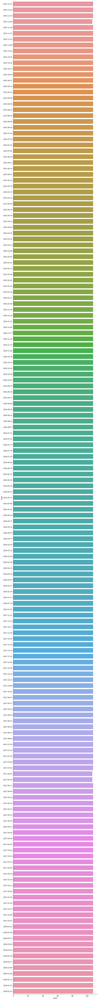

<Figure size 21600x21600 with 0 Axes>

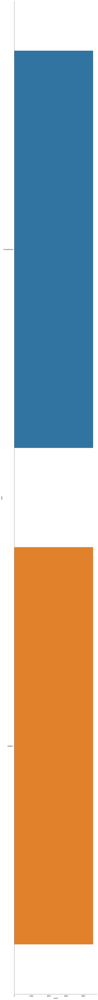

<Figure size 21600x21600 with 0 Axes>

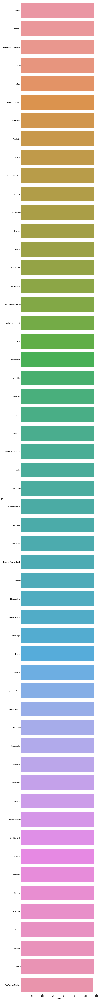

In [13]:
for x in data1.select_dtypes(object).columns:
    plt.figure(figsize=(300,300))
    sns.catplot(y=x, kind='count', data=data1, height=90, margin_titles=True, aspect=0.1)
    plt.show()

# Tabulated Analysis Of Above Countplots

In [14]:
object_description=data1.select_dtypes(object).describe()
object_description=object_description.rename(index={'count':'count of values', 'unique':'unique values', 'top':'most frequent value', 'freq':'frequency of most frequent value'})
dict1=object_description.iloc[0,:]-object_description.iloc[3,:]
object_description1=pd.concat([object_description, pd.DataFrame(dict1).T])
object_description1=object_description1.rename(index={0:'count of remaining values'})
object_description1

,Date,type,region
count of values,18249,18249,18249
unique values,169,2,54
most frequent value,2015-12-27,conventional,Albany
frequency of most frequent value,108,9126,338
count of remaining values,18141,9123,17911


# Verbal Translation Of Above Table

# Anomalies Detected
1. There are 3 categorical features: Date, type and region.
2. There are 169 unique values in date.
3. There are 2 unique values in type.
4. There are 54 unique values in region.
5. 27.12.2015 occured most number of of times.
6. 04.01.2015 occured minimum number of times.
7. Type: Conventional occured 9126 times.
8. Type: Organic occured 9123 times
9. Of 54 regions, 53 regions occured 338 times each.
10. Region: WestTexNewMexico occured least number of times (335 times).

# Dataset Visualization                                                                                                     

# Head View

In [211]:
data1.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


# The above table represents first five rows of original dataset

# Sample View

In [212]:
data1.sample()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
14417,2016-03-20,1.08,4726.65,88.02,1757.48,0.0,2881.15,441.53,2439.62,0.0,organic,2016,Spokane


# The above table represents a random row as sample row from the dataset

# Tail View

In [213]:
data1.tail()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico
18248,2018-01-07,1.62,17489.58,2894.77,2356.13,224.53,12014.15,11988.14,26.01,0.0,organic,2018,WestTexNewMexico


# The above table represents last five rows of the dataframe.

# Feature Engineering

# Encoding

# Names of all object columns (3 such columns)

In [19]:
data1.select_dtypes(object).columns

Index(['Date', 'type', 'region'], dtype='object')

# Encoding Of All Other Object Columns With Ordinal Encoder (8 such columns)

In [225]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data1.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data1.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,Date_encoded,type_encoded,region_encoded
0,51.0,0.0,0.0
1,50.0,0.0,0.0
2,49.0,0.0,0.0
3,48.0,0.0,0.0
4,47.0,0.0,0.0
...,...,...,...
18244,161.0,1.0,53.0
18245,160.0,1.0,53.0
18246,159.0,1.0,53.0
18247,158.0,1.0,53.0


# Comparison Of Encoded Column And Original Column ('Region')

In [226]:
encoded_data['region_encoded'].unique()

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51.,
       52., 53.])

In [227]:
data1['region'].unique()

array(['Albany', 'Atlanta', 'BaltimoreWashington', 'Boise', 'Boston',
       'BuffaloRochester', 'California', 'Charlotte', 'Chicago',
       'CincinnatiDayton', 'Columbus', 'DallasFtWorth', 'Denver',
       'Detroit', 'GrandRapids', 'GreatLakes', 'HarrisburgScranton',
       'HartfordSpringfield', 'Houston', 'Indianapolis', 'Jacksonville',
       'LasVegas', 'LosAngeles', 'Louisville', 'MiamiFtLauderdale',
       'Midsouth', 'Nashville', 'NewOrleansMobile', 'NewYork',
       'Northeast', 'NorthernNewEngland', 'Orlando', 'Philadelphia',
       'PhoenixTucson', 'Pittsburgh', 'Plains', 'Portland',
       'RaleighGreensboro', 'RichmondNorfolk', 'Roanoke', 'Sacramento',
       'SanDiego', 'SanFrancisco', 'Seattle', 'SouthCarolina',
       'SouthCentral', 'Southeast', 'Spokane', 'StLouis', 'Syracuse',
       'Tampa', 'TotalUS', 'West', 'WestTexNewMexico'], dtype=object)

# Conclusion
Regions appearing in unique list index from 0 to 53 are encoded as 0 to 53 in recurrent manner.

# Concatenating Encoded Data With Original Data

In [228]:
data=pd.concat([data1, encoded_data], axis=1)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,47.0,0.0,0.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [229]:
final_dataframe=data.copy()

In [230]:
final_dataframe.isna().values.any()

False

In [231]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

In [232]:
final_dataframe[np.isinf(final_dataframe)] = 0

# There are no null and missing values in final dataframe.

# EDA Part 1

In [28]:
final_dataframe[:10]

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,47.0,0.0,0.0
5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,2015,46.0,0.0,0.0
6,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.0,2015,45.0,0.0,0.0
7,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.0,2015,44.0,0.0,0.0
8,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.0,2015,43.0,0.0,0.0
9,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.0,2015,42.0,0.0,0.0


# The above table represents first 10 rows from final dataframe.

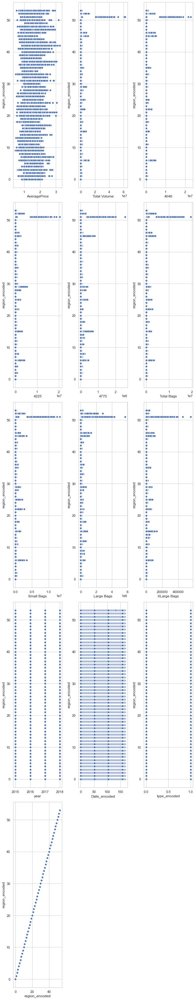

In [29]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(colist[x], y='region_encoded', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that 

1. distribution is mostly evenly distributed for most of the columns. For example, 
i. Date encoded

ii. type encoded

iii. year

2. A few outliers are found in:

i. Average price in regions 50 and 41.

3. Many outliers are detected in all other columns:

i. Total Volume: outliers found in region 51

ii. 4046: outliers found in region 51

iii. 4225: outliers found in region 51

iv. year: outliers found in region 51

Anomalies:

1. Region 51 is making the data biased.

2. Organic and Coventional Avocado were supplied almost equally to all the regions.

3. Date of record of sales for each region is equally distributed.

Q&A Answered:
1. Region that has highest sales: Region 51

2. Region with maximum price: Region 42

3. Maximum Price: 3

4. Region with maximum volume: 51

5. Region with maximum bags of all sizes: 51

# Value Count Of employees vulnerable to attrition and not.

In [30]:
data['region_encoded'].value_counts()

0.0     338
40.0    338
29.0    338
30.0    338
31.0    338
32.0    338
33.0    338
34.0    338
35.0    338
36.0    338
37.0    338
38.0    338
39.0    338
41.0    338
1.0     338
42.0    338
43.0    338
44.0    338
45.0    338
46.0    338
47.0    338
48.0    338
49.0    338
50.0    338
51.0    338
52.0    338
28.0    338
27.0    338
26.0    338
25.0    338
2.0     338
3.0     338
4.0     338
5.0     338
6.0     338
7.0     338
8.0     338
9.0     338
10.0    338
11.0    338
12.0    338
13.0    338
14.0    338
15.0    338
16.0    338
17.0    338
18.0    338
19.0    338
20.0    338
21.0    338
22.0    338
23.0    338
24.0    338
53.0    335
Name: region_encoded, dtype: int64

# Verbal Translation Of Above Value Counts

# Anomalies Detected: 
1. Of 54 regions, 53 regions occured 338 times each.
2. Region: WestTexNewMexico occured least number of times (335 times).

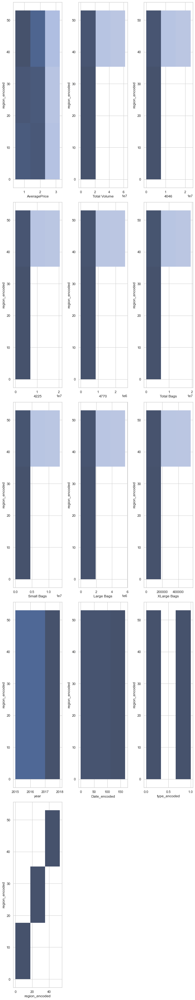

In [31]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='region_encoded', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

In [221]:
final_dataframe.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', 'year', 'Date_encoded',
       'type_encoded', 'region_encoded'],
      dtype='object')

# The above histograms show frequency distribution of features agains label. It is divided into 3 bins. Only Average Price seems to be close to normal with skewness threshold within +/-0.65. Normal distribution has 0 skewness. 
1. The entire dataframe against region encoded has skewness 3 and kurtosis -1.2, indicating high abnormalities with region encoded as label. It reflects right skewed and platykurtic data.

2. 3 columns have 0 skewness (as desired in normal distribution):

i. region_encoded,

ii. date_encoded,

iii. type_encoded.

3. Moderate skewness is observed in year.

4. High skewness is observed in sales and total volume.

# Action Plan From Above Anomalies:

1. Requires outliers removal and transgormation to save adequately informative data for predictive development.

2. Requires data scaling to normalize the existing columns and hence removing abnormally widespread data points.

# Q&A Answered:

1. Average Price Range: 0 to 3 for all the regions, distribution is normal.

2. Total Volume: 0 to 2 for ~35 regions and beyond that is normally distributed in the range 2 to 6, distribution is right skewed.

3. 4046: total sales in this series is less than 1 for ~35 regions and beyond that is normally distributed in the range 1 to 2, distribution is right skewed.          

4. 4225: total sales in this series is less than 1 for ~35 regions and beyond that is normally distributed in the range 1 to 2, distribution is right skewed.

5. 4770: total sales in this series is less than 1 for ~35 regions and beyond that is normally distributed in the range 1 to 2, distribution is right skewed.

5. Total Bags: total bags in this series is less than 1 for ~35 regions and beyond that is normally distributed in the range 1 to 2, distribution is right skewed.

Of these total bags:
    i. Small Bags Range: 0 to 1
    ii. Large Bags: 0 to 6
    ii. XLarge Bags 0 to 400000

# Correlation Analysis

# Mathematical Notation:
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

In [32]:
final_dataframe.corr()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
AveragePrice,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.093197,0.145514,0.615845,-0.011716
Total Volume,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,0.017193,0.009263,-0.232434,0.174176
4046,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,0.003353,-0.005028,-0.225819,0.192073
4225,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.009559,-0.016895,-0.232289,0.145726
4770,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.036531,-0.047517,-0.210027,0.095252
Total Bags,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,0.071552,0.064688,-0.217788,0.175256
Small Bags,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,0.063915,0.056902,-0.220535,0.164702
Large Bags,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,0.087891,0.081855,-0.193177,0.198768
XLarge Bags,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,0.081033,0.077374,-0.175483,0.082281
year,0.093197,0.017193,0.003353,-0.009559,-0.036531,0.071552,0.063915,0.087891,0.081033,1.000000,0.950274,-0.000032,-0.000055


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of Total Volume, Sales, Total Bags, breakdown of sizes of bags; that show strong correlation between each other. Other  than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

# Graphical Translation Of Above Table

<AxesSubplot:>

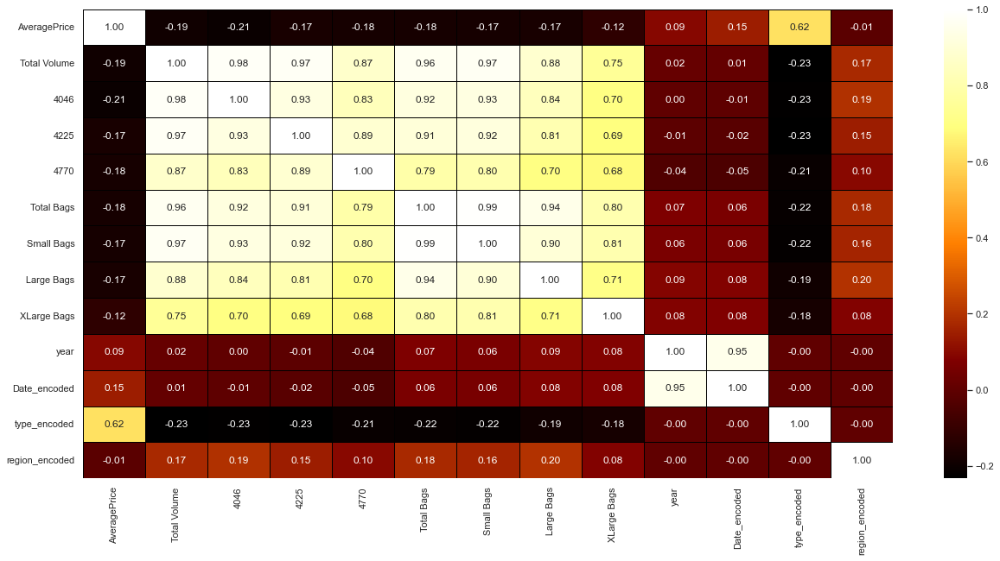

In [34]:
plt.figure(figsize=(21,10))
sns.heatmap(data.corr(), annot=True, linewidths=0.5, linecolor='black', fmt='.2f', cmap='afmhot')

# Verbal Translation Of Above Graph:
# 1. Label has moderate negative relationship with 4 features:
    i. Average Price

    ii. Year

    iii. Date Encoded

    iv. Type Encoded

# 2. Label has moderate relationship with these features in this heatmap:
    i. Total Volume

    ii. 4046

    iii. 4225

    iv. 4770

    v. Total Bags

    vi. Small Bags

    vii. Large Bags

    viii. XLargeBags

# 3. Strong Multicollinearity is detected among 5 features:
    i. Total Volume

    ii. 4046

    iii. 4225

    iv. 4770

    v. Total Bags

    vi. Small Bags

    vii. Large Bags

    viii. XLargeBags

# 4. Multicollinearity seems to be moderate among all other data points.

# Graphical Representation Of Correlation Of Features With Label

In [33]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame((final_dataframe.corr()['region_encoded'])).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with labe is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:

# 1. Highest correlation with label is observed to be 19.90%, that is shared with Large Bags. Minimum correlation is -0.0055%, shared with year.

# 2. Weak Negative Relationship Is Found With Following Features:

    i. AveragePrice     -0.011716
    ii. type_encoded     -0.000280
    iii. Date_encoded     -0.000101
    iv. year             -0.000055

# 3. Weak Positive Relationship Is Found With Following Features:

    i. 4225              0.145726
    ii. Total Volume      0.174176
    iii. 4046              0.192073


# 4. Correlation Of Label with itself is of no relevance

# Data Handling Conclusion Of Correlation

# Overall correlation among dataset. There seems some multicollinearity due to presence of Job Level and Age; Marital Status Encoded and Stock Option Level; that show strong correlation between each other. Other than these columns there seems modest collinearity among features. We will do further eda befor arriving at a conclusion to delete these columns.

# 1. The most useful feature is Average Price, apart from this, there seems modest correlation of features with label.

# 2. As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:

    i. Total Volume

    ii. 4046

    iii. 4225

    iv. 4770

    v. Total Bags

    vi. Small Bags

    vii. Large Bags

    viii. XLargeBags
    
# 3. Highest Bias (Multicollinearity) is observed in Total Volume.

# Dataset Information Table

In [35]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   AveragePrice    18249 non-null  float64
 1   Total Volume    18249 non-null  float64
 2   4046            18249 non-null  float64
 3   4225            18249 non-null  float64
 4   4770            18249 non-null  float64
 5   Total Bags      18249 non-null  float64
 6   Small Bags      18249 non-null  float64
 7   Large Bags      18249 non-null  float64
 8   XLarge Bags     18249 non-null  float64
 9   year            18249 non-null  int64  
 10  Date_encoded    18249 non-null  float64
 11  type_encoded    18249 non-null  float64
 12  region_encoded  18249 non-null  float64
dtypes: float64(12), int64(1)
memory usage: 1.8 MB


# The above table reprents information dataset:
    
    i. Columns

    ii. Count Of Non Null Data Points

    iii. Values data type for each columns

    iv. Count of data types in iii.

    v. Memory Usage

   # It can be deduced that the dataset has 18249 rows and each columns has no missing values. The datatypes used are float64 and int64. There 12 float64 columns and 1 int64 column. Memory usage is 1.8MB.

# Names of all the columns

In [36]:
data.select_dtypes(include = [np.number]).columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'Date_encoded',
       'type_encoded', 'region_encoded'],
      dtype='object')

# The above code cell highlights all numeric values, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [37]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
import time
for x in colist:
    try:
        plot = px.violin(x=x, y=final_dataframe['region_encoded'])
        plt.show()
    except ValueError:
        print('{} : Values Are Outside Scaling Region, try using skewness function to detect outlier'.format(x))        
        continue

AveragePrice : Values Are Outside Scaling Region, try using skewness function to detect outlier
Total Volume : Values Are Outside Scaling Region, try using skewness function to detect outlier
4046 : Values Are Outside Scaling Region, try using skewness function to detect outlier
4225 : Values Are Outside Scaling Region, try using skewness function to detect outlier
4770 : Values Are Outside Scaling Region, try using skewness function to detect outlier
Total Bags : Values Are Outside Scaling Region, try using skewness function to detect outlier
Small Bags : Values Are Outside Scaling Region, try using skewness function to detect outlier
Large Bags : Values Are Outside Scaling Region, try using skewness function to detect outlier
XLarge Bags : Values Are Outside Scaling Region, try using skewness function to detect outlier
year : Values Are Outside Scaling Region, try using skewness function to detect outlier
Date_encoded : Values Are Outside Scaling Region, try using skewness function t

# Verbal Translation Of Above Graph
1. The data seems to be biased, as analyzed above. I has values scattered beyond acceptable range and hence it cannot be plotted. We go through descriptive stats for furtheranalysis.

# Descriptive Statistics

In [38]:
description=final_dataframe.describe()
description

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,83.997096,0.499918,26.495644
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,48.787638,0.500014,15.583788
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,0.000000,0.000000,0.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,42.000000,0.000000,13.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,84.000000,0.000000,26.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,126.000000,1.000000,40.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,168.000000,1.000000,53.000000


In [39]:
lst=description.columns.to_list()
print(lst)

['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'Date_encoded', 'type_encoded', 'region_encoded']


In [40]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[0.2899999999999998], [325585.52999999997], [102374.9], [121145.83999999998], [6058.43], [71039.54], [56974.85], [19381.54], [132.5], [1.0], [42.0], [1.0], [14.0]]


(13, None)

In [41]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
IQR,0.29,325585.53,102374.9,121145.84,6058.43,71039.54,56974.85,19381.54,132.5,1.0,42.0,1.0,14.0


In [42]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[2.81], [62505561.96], [22743616.17], [20470572.61], [2546439.11], [19373134.37], [13384586.8], [5719096.61], [551693.65], [3.0], [168.0], [1.0], [53.0]]


(13, None)

In [43]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
Range,2.81,62505561.96,22743616.17,20470572.61,2546439.11,19373134.37,13384586.8,5719096.61,551693.65,3.0,168.0,1.0,53.0


In [44]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(          AveragePrice  Total Volume     4046      4225       4770  \
 Skewness      0.580303      9.007687  8.64822  8.942466  10.159396   
 
           Total Bags  Small Bags  Large Bags  XLarge Bags      year  \
 Skewness    9.756072     9.54066    9.796455    13.139751  0.215339   
 
           Date_encoded  type_encoded  region_encoded  
 Skewness      0.000117      0.000329         0.00003  ,
           AveragePrice  Total Volume       4046       4225        4770  \
 Kurtosis      0.325196     92.104458  86.809113  91.949022  132.563441   
 
           Total Bags  Small Bags  Large Bags  XLarge Bags      year  \
 Kurtosis  112.272156  107.012885  117.999481   233.602612 -1.032747   
 
           Date_encoded  type_encoded  region_encoded  
 Kurtosis     -1.200036     -2.000219       -1.200783  )

# Outcome Table Of Descriptive Statistics

In [45]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,83.997096,0.499918,26.495644
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,48.787638,0.500014,15.583788
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,0.000000,0.000000,0.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,42.000000,0.000000,13.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,84.000000,0.000000,26.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,126.000000,1.000000,40.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,168.000000,1.000000,53.000000
IQR,0.290000,3.255855e+05,1.023749e+05,1.211458e+05,6.058430e+03,7.103954e+04,5.697485e+04,1.938154e+04,132.500000,1.000000,42.000000,1.000000,14.000000
Range,2.810000,6.250556e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,3.000000,168.000000,1.000000,53.000000


# Graphical Representation Of Above Table

In [223]:
final_dataframe.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', 'year', 'Date_encoded',
       'type_encoded', 'region_encoded'],
      dtype='object')

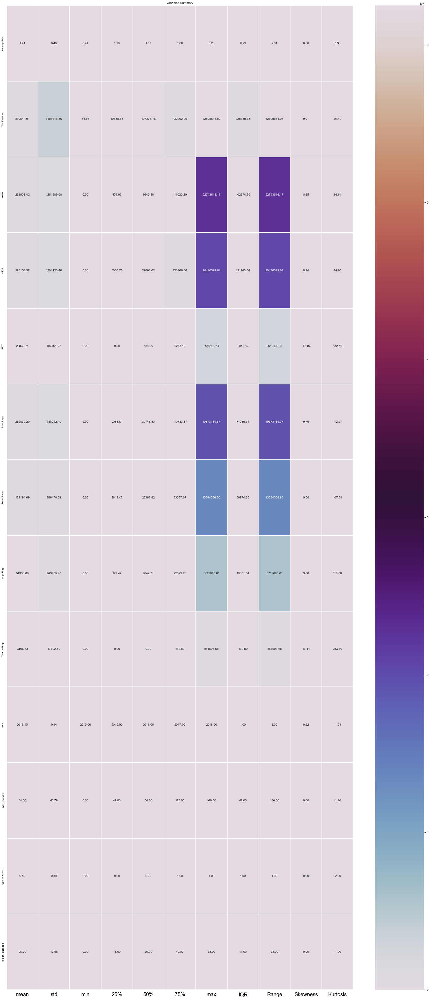

In [234]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, cmap='twilight')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=10, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic
1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

2. The entire dataset ranges from 0 till 62505646.52.

3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

4. Skewness is 0 and within +/- 0.65 for:

    1. The entire dataframe against region encoded has skewness 3 and kurtosis -1.2, indicating high abnormalities with region encoded as label. It reflects right skewed and platykurtic data.

    2. 3 columns have 0 skewness (as desired in normal distribution):

        i. region_encoded,

        ii. date_encoded,

        iii. type_encoded.

    3. Moderate skewness is observed in year.

    4. High skewness is observed in sales and total volume.

5. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

6. Kutosis is upto 3 for most dataset, indicating platykurtic curves.

7. Kurtosis is greater than 3, indicating, leptokurtic curve for:
    
    Total Volume       92.104458
    
    4046               86.809113
    
    4225               91.949022
    
    4770              132.563441
    
    Total Bags        112.272156
    
    Small Bags        107.012885
    
    Large Bags        117.999481
    
    XLarge Bags       233.602612

8. Kurtosis for bell shaped curve should be 3.

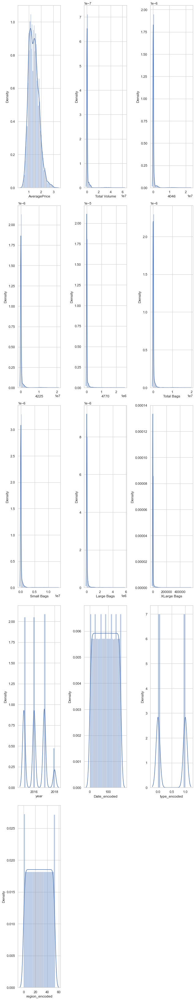

In [47]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

In [238]:
final_dataframe.skew().sort_values()

region_encoded     0.000030
Date_encoded       0.000117
type_encoded       0.000329
year               0.215339
AveragePrice       0.580303
4046               8.648220
4225               8.942466
Total Volume       9.007687
Small Bags         9.540660
Total Bags         9.756072
Large Bags         9.796455
4770              10.159396
XLarge Bags       13.139751
dtype: float64

# Observations

# 1. Acceptable skewness is +/-0.65 and Right skewness for bell shaped curve is 0


# 2. Acceptable And Outliers Prone Right Skewness is observed in:

    region_encoded     0.000030

    Date_encoded       0.000117

    type_encoded       0.000329

    year               0.215339

    AveragePrice       0.580303

    4046               8.648220

    4225               8.942466

    Total Volume       9.007687

    Small Bags         9.540660

    Total Bags         9.756072

    Large Bags         9.796455

    4770              10.159396

    XLarge Bags       13.139751


# 3. Bell Shaped Curve (O skewness) is observed in:

    None of the columns

# Conclusion:

# Based On EDA done above in two parts, I am romving 2 columns, as part of Error Removal And Data Handling:

    XLarge Bags,

    4770, 

    Large Bags, 

    Total Bags, 

    Small Bags.


# Error Removal And Data Handling

# Based On EDA done above in two parts, I am romving 2 columns, as part of Error Removal And Data Handling:
    XLarge Bags,

    4770, 

    Large Bags, 

    Total Bags, 

    Small Bags.
 
 # Although, Total Volume is detected to have large multicollinearity  bias, it has low skewness and hence, I will filter it through variance filter and then hypothesis test on it. Based on final p values, I make a conclusion about Total Volume and other remaining columns.

In [49]:
final_dataframe=final_dataframe.drop(['XLarge Bags', '4770', 'Large Bags', 'Total Bags', 'Small Bags'], axis=1)
final_dataframe

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,2018,158.0,1.0,53.0


# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

# Z Score: Outliers Treatment

In [50]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
final_dataframe[np.isinf(final_dataframe)] = 0
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(method='ffill')
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(18249, 8)

In [51]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([  346,   359,  1516,  1518,  1541,  2368,  2370,  2652,  2652,
        2652,  2653,  2653,  2653,  2654,  2654,  2654,  2655,  2655,
        2655,  2656,  2656,  2656,  2657,  2657,  2657,  2658,  2658,
        2658,  2659,  2659,  2659,  2660,  2660,  2660,  2661,  2661,
        2661,  2662,  2662,  2662,  2663,  2663,  2663,  2664,  2664,
        2664,  2665,  2665,  2665,  2666,  2666,  2666,  2667,  2667,
        2667,  2668,  2668,  2668,  2669,  2669,  2669,  2670,  2670,
        2670,  2671,  2671,  2671,  2672,  2672,  2672,  2673,  2673,
        2673,  2674,  2674,  2674,  2675,  2675,  2675,  2676,  2676,
        2676,  2677,  2677,  2677,  2678,  2678,  2678,  2679,  2679,
        2679,  2680,  2680,  2680,  2681,  2681,  2681,  2682,  2682,
        2682,  2683,  2683,  2683,  2684,  2684,  2684,  2685,  2685,
        2685,  2686,  2686,  2686,  2687,  2687,  2687,  2688,  2688,
        2688,  2689,  2689,  2689,  2690,  2690,  2690,  2691,  2691,
        2691,  2692

# The cell above displays outlier values.

In [52]:
len(np.where(score>3)[0])

663

# The cell above shows number of outliers.

In [53]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,2018,158.0,1.0,53.0


# The table above shows the final dataframe after removing outliers, 663 rows are removed and resultant dimension is 17926 rows * 8 columns

# IQR Method Of Outliers Removal

# Since, many rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [54]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [55]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
18244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [56]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [57]:
new_df=new_df.fillna(method='bfill')
new_df

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,2018,158.0,1.0,53.0


# The above table displays the final dataframe after IQR  treatment, since this method restores all the rows. It signifies that outliers are not very much spread and can be treated with power transform method.

# I prefer ZScore+ Power Transform in this case because outliers are very significant in particular regions and dataset is quite large, indicating, possibility of overfitting.

# It would be prudent to remove some rows with outliers and then perform outliers transformation of remaining data for better pre processing.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

Label vector is region_encoded.

In [58]:
fina_dataframe=data_new.copy()
x=final_dataframe.drop(['region_encoded'], axis=1)
y=final_dataframe['region_encoded']
x.sample()

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded
14477,0.68,15106.42,1490.93,595.22,2016,55.0,1.0


# The above table displays a sample of features vector.

In [59]:
y.sample()

17619    1.0
Name: region_encoded, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [60]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded
0,-0.086248,-0.086605,-0.658619,0.307313,-1.221895,-0.583054,-0.999836
1,-0.034022,-0.155746,-0.776870,0.231647,-1.221895,-0.605325,-0.999836
2,-1.273938,0.179327,-0.731947,0.579503,-1.221895,-0.627722,-0.999836
3,-0.793421,0.003876,-0.634200,0.415100,-1.221895,-0.650247,-0.999836
4,-0.219440,-0.187640,-0.685293,0.224806,-1.221895,-0.672903,-0.999836
...,...,...,...,...,...,...,...
18244,0.640729,-0.674587,-0.467366,-0.919470,1.968548,1.440963,1.000164
18245,0.816307,-0.767550,-0.619883,-0.665372,1.968548,1.424894,1.000164
18246,1.147790,-0.771505,-0.619831,-0.772496,1.968548,1.408796,1.000164
18247,1.265876,-0.698077,-0.550282,-0.710543,1.968548,1.392669,1.000164


# The above table displays outliers transformed values as discussed above.

In [61]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [62]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,53])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[25.82829894, 27.62920189, 17.54665759, ...,  0.        ,
        22.04093741,  0.        ],
       [26.25223433, 27.01024521, 16.3152277 , ...,  0.        ,
        21.71809324,  0.        ],
       [16.18748412, 30.00986839, 16.78304351, ...,  0.        ,
        21.39343607,  0.        ],
       ...,
       [35.84534115, 21.49786144, 17.95058311, ..., 53.        ,
        50.91446239, 53.        ],
       [36.8038776 , 22.15520266, 18.6748502 , ..., 53.        ,
        50.68069488, 53.        ],
       [31.54721514, 22.46197389, 20.57404202, ..., 53.        ,
        50.44650712, 53.        ]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 0 to 53 because that is classification  range, hence, model performance can be sound.

In [63]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [64]:
x_frame1.values.max()

53.00000000000001

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

# Variance Inflation Factor

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
1,161.959021,Total Volume
3,73.849130,4225
5,44.234502,Date_encoded
2,37.695473,4046
4,19.413371,year
0,16.634763,AveragePrice
6,4.924546,type_encoded


In [66]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
1,161.959021,Total Volume
3,73.849130,4225
5,44.234502,Date_encoded
2,37.695473,4046
4,19.413371,year
0,16.634763,AveragePrice


In [69]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['Total Volume', '4225', 'Date_encoded'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
0,11.156467,AveragePrice
1,4.818672,4046
3,4.417886,type_encoded
2,2.512186,year


# Since, all the vif scores are below 11.16, I can pass the listed features for feature selection (I have decieded threshold based on prediction range of 0 to 53).

# Data Handling Conclusion

# Concluding Points:
# 1. As part of data handling, I have removed features with high outliers (by analyzing box plots, dist plots, variable plot, scatter plots and descriptive plots).                            

# 2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.                                                                  
# 3. Hence, the model can be expected to be low bias model.

# Feature Selection

In [70]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [71]:
x.shape, y.shape

((18249, 7), (18249,))

In [72]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train with randomness value as 100.

In [73]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those. To ensure low variance, I have taken variance threshold of 0.01.

<AxesSubplot:>

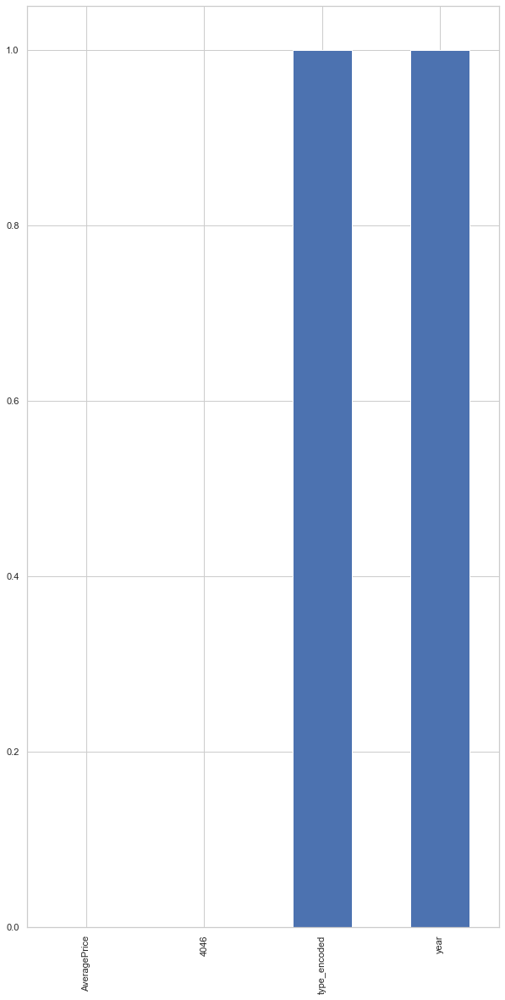

In [74]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [75]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['AveragePrice', '4046'], dtype='object')

# These features strongly impact attrition and control actions are required mainly on these to curb the problems around attrition.

# P Values are an important component of feature selection, with significance level set to 0.05, Variance Threshold
    ensemble technique returns with 95% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.05 are:
Index(['AveragePrice', '4046'], dtype='object')

In [76]:
import numpy as np
x=x_frame1.copy()
x=x[['AveragePrice', '4046']]
x.sample()

,AveragePrice,4046
2814,31.547215,21.167992


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [77]:
y.sample()

14110    41.0
Name: region_encoded, dtype: float64

# The above series displays a sample of label.

In [78]:
x.shape, y.shape

((18249, 2), (18249,))

# The above cell displays final shapes of x and y vectors

In [79]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [80]:
x_train.shape, y_train.shape

((7299, 2), (7299,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Total Models = 8)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven label points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve a goodness of fit. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low). 

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is support vector classifier and hence, is again a very powerful implementation to prevent illness of fit and make appropriate decision boundaries.

# Model 1

# Random Forest Classifier With Intuitional Hyper Parameter Tuning

In [81]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [82]:
model1_prediction_train

,y_train,yhat
2344,45.0,23.0
4186,26.0,23.0
8556,6.0,23.0
4968,41.0,23.0
15050,5.0,23.0
...,...,...
5124,44.0,23.0
12363,8.0,23.0
9959,16.0,23.0
15413,12.0,23.0


In [83]:
model1_prediction_test

,y_test,yhat
15233,9.0,23.0
13057,21.0,23.0
1100,21.0,23.0
7150,28.0,23.0
2881,1.0,23.0
...,...,...
8647,14.0,23.0
6928,24.0,23.0
3065,4.0,23.0
17216,46.0,23.0


In [84]:
# Model 1 Metrics

In [85]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))
#Since risk is low model is low variance and since train score and test score are equivalent, model is low bias too.

Train Score:  0.02
Test Score:  0.02
Train Accuracy Score:  0.02
Test Accuracy Score:  0.02
Cross Validation Score:  0.02
Cross Validation Risk:  0.0


In [86]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       200
         1.0       0.00      0.00      0.00       212
         2.0       0.00      0.00      0.00       211
         3.0       0.00      0.00      0.00       207
         4.0       0.00      0.00      0.00       212
         5.0       0.00      0.00      0.00       219
         6.0       0.00      0.00      0.00       194
         7.0       0.00      0.00      0.00       205
         8.0       0.00      0.00      0.00       202
         9.0       0.00      0.00      0.00       206
        10.0       0.00      0.00      0.00       200
        11.0       0.00      0.00      0.00       205
        12.0       0.00      0.00      0.00       189
        13.0       0.00      0.00      0.00       207
        14.0       0.00      0.00      0.00       221
        15.0       0.00      0.00      0.00       204
        16.0       0.00      0.00      0.00       201
        17.0       0.00    

In [87]:
print(confusion_matrix(y_test,ytst_pred))

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [88]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print(auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [89]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
try:
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')

Multi Class Format Is Not Supported For ROC Curve



# Model 2

# Random Forest Classifier With Default Hyper Parameter Tuning

In [90]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [91]:
model2_prediction_train

,y_train,yhat
2344,45.0,45.0
4186,26.0,26.0
8556,6.0,6.0
4968,41.0,41.0
15050,5.0,5.0
...,...,...
5124,44.0,44.0
12363,8.0,8.0
9959,16.0,16.0
15413,12.0,12.0


In [92]:
model2_prediction_test

,y_test,yhat
15233,9.0,7.0
13057,21.0,11.0
1100,21.0,38.0
7150,28.0,32.0
2881,1.0,24.0
...,...,...
8647,14.0,0.0
6928,24.0,24.0
3065,4.0,19.0
17216,46.0,46.0


In [93]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.19
Train Accuracy Score:  1.0
Test Accuracy Score:  0.19
Cross Validation Score:  0.14
Cross Validation Risk:  0.03


In [94]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.11      0.14      0.12       200
         1.0       0.18      0.16      0.17       212
         2.0       0.14      0.12      0.13       211
         3.0       0.23      0.20      0.21       207
         4.0       0.16      0.15      0.15       212
         5.0       0.17      0.14      0.15       219
         6.0       0.31      0.32      0.32       194
         7.0       0.18      0.19      0.18       205
         8.0       0.13      0.12      0.12       202
         9.0       0.19      0.17      0.18       206
        10.0       0.14      0.16      0.15       200
        11.0       0.29      0.31      0.30       205
        12.0       0.10      0.10      0.10       189
        13.0       0.09      0.09      0.09       207
        14.0       0.10      0.09      0.09       221
        15.0       0.22      0.21      0.21       204
        16.0       0.07      0.06      0.06       201
        17.0       0.36    

In [95]:
print(confusion_matrix(y_test, ytst_pred1))

[[ 27   4   1 ...   0   0   3]
 [  3  34   3 ...   3   0  10]
 [  2   3  25 ...   1   5   2]
 ...
 [  0   1   1 ... 131   2   0]
 [  0   0   7 ...   2  45   0]
 [  4  12   2 ...   0   0  39]]


In [96]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [97]:
from sklearn import metrics
try:
    y_pred_proba =rfc1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')

Multi Class Format Is Not Supported For ROC Curve


# Model 3

# RFC With Grid Search CV

In [98]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim) #saving the best model
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [99]:
# Model 3 Predictions

In [100]:
model3_prediction_train

,y_train,yhat
2344,45.0,45.0
4186,26.0,26.0
8556,6.0,6.0
4968,41.0,41.0
15050,5.0,5.0
...,...,...
5124,44.0,44.0
12363,8.0,8.0
9959,16.0,16.0
15413,12.0,12.0


In [101]:
model3_prediction_test

,y_test,yhat
15233,9.0,7.0
13057,21.0,12.0
1100,21.0,38.0
7150,28.0,22.0
2881,1.0,31.0
...,...,...
8647,14.0,0.0
6928,24.0,24.0
3065,4.0,19.0
17216,46.0,46.0


In [102]:
# Model 3 Metrics

In [103]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  1.0
Test Score:  0.2
Train Accuracy Score:  1.0
Test Accuracy Score:  0.2


In [104]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 100, 'n_jobs': -1, 'oob_score': False, 'warm_start': False}
0.20303980020092577


In [105]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(criterion='entropy', max_features='sqrt', n_jobs=-1)


In [106]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.13      0.15      0.14       200
         1.0       0.18      0.16      0.17       212
         2.0       0.14      0.11      0.13       211
         3.0       0.26      0.25      0.25       207
         4.0       0.16      0.14      0.15       212
         5.0       0.17      0.14      0.15       219
         6.0       0.27      0.33      0.30       194
         7.0       0.17      0.19      0.18       205
         8.0       0.13      0.11      0.12       202
         9.0       0.26      0.25      0.26       206
        10.0       0.14      0.16      0.15       200
        11.0       0.30      0.32      0.31       205
        12.0       0.11      0.10      0.10       189
        13.0       0.10      0.09      0.09       207
        14.0       0.11      0.09      0.10       221
        15.0       0.22      0.22      0.22       204
        16.0       0.07      0.07      0.07       201
        17.0       0.34    

In [107]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [108]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


# Model 4

# Bagging Classifier With Grid Search CV Hyper Parameter Tuning

In [109]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [110]:
# Model 4 Predictions

In [111]:
model4_prediction_train

,y_train,yhat
2344,45.0,45.0
4186,26.0,26.0
8556,6.0,6.0
4968,41.0,41.0
15050,5.0,5.0
...,...,...
5124,44.0,44.0
12363,8.0,8.0
9959,16.0,16.0
15413,12.0,12.0


In [112]:
model4_prediction_test

,y_test,yhat
15233,9.0,7.0
13057,21.0,12.0
1100,21.0,38.0
7150,28.0,22.0
2881,1.0,24.0
...,...,...
8647,14.0,0.0
6928,24.0,24.0
3065,4.0,19.0
17216,46.0,46.0


In [113]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  1.0
Test Score:  0.2
Train Accuracy Score:  1.0
Test Accuracy Score:  0.2


In [114]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 10000}
0.20769846113400997


In [115]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=10000)


In [116]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.10      0.12      0.11       200
         1.0       0.16      0.13      0.15       212
         2.0       0.15      0.14      0.14       211
         3.0       0.28      0.25      0.26       207
         4.0       0.19      0.17      0.18       212
         5.0       0.18      0.15      0.16       219
         6.0       0.29      0.34      0.32       194
         7.0       0.15      0.16      0.16       205
         8.0       0.13      0.12      0.13       202
         9.0       0.28      0.30      0.29       206
        10.0       0.15      0.18      0.17       200
        11.0       0.31      0.33      0.32       205
        12.0       0.10      0.09      0.10       189
        13.0       0.13      0.13      0.13       207
        14.0       0.11      0.07      0.09       221
        15.0       0.23      0.23      0.23       204
        16.0       0.10      0.10      0.10       201
        17.0       0.34    

In [117]:
print(confusion_matrix(y_test, ytst_pred3))

[[ 23   1   2 ...   0   0   2]
 [  8  28   1 ...   1   0  11]
 [  1   2  29 ...   1   8   4]
 ...
 [  0   2   2 ... 126   1   0]
 [  0   0   8 ...   2  46   0]
 [  2  12   2 ...   0   0  34]]


In [239]:
model4_save=pickle.dumps(best_estim1) #saving the best model

In [118]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [119]:
from sklearn import metrics
try:
    y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


# Model5

# Decision Tree Regressor With Default Hyper Parameter Tuning

In [120]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [121]:
y_pred5=pd.DataFrame(clf.predict(x_train), columns=['yhat'])
print('Train Prediction\n')
y_pred5

Train Prediction



,yhat
0,21.0
1,21.0
2,21.0
3,21.0
4,23.0
...,...
7294,21.0
7295,23.0
7296,23.0
7297,21.0


In [122]:
ytst_pred5=pd.DataFrame(clf.predict(x_test), columns=['yhat'])
print('Test Prediction\n')
ytst_pred5

Test Prediction



,yhat
0,23.0
1,21.0
2,21.0
3,23.0
4,21.0
...,...
10945,23.0
10946,23.0
10947,21.0
10948,23.0


In [123]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.02
Test Score:  0.02
Train Accuracy Score:  0.02
Test Accuracy Score:  0.02
Cross Validation Score:  0.02
Cross Validation Risk:  0.0


In [124]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       200
         1.0       0.00      0.00      0.00       212
         2.0       0.00      0.00      0.00       211
         3.0       0.00      0.00      0.00       207
         4.0       0.00      0.00      0.00       212
         5.0       0.00      0.00      0.00       219
         6.0       0.00      0.00      0.00       194
         7.0       0.00      0.00      0.00       205
         8.0       0.00      0.00      0.00       202
         9.0       0.00      0.00      0.00       206
        10.0       0.00      0.00      0.00       200
        11.0       0.00      0.00      0.00       205
        12.0       0.00      0.00      0.00       189
        13.0       0.00      0.00      0.00       207
        14.0       0.00      0.00      0.00       221
        15.0       0.00      0.00      0.00       204
        16.0       0.00      0.00      0.00       201
        17.0       0.00    

In [125]:
print(confusion_matrix(y_test, ytst_pred5))

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [126]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred5), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [127]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is off for model development.')

Graph cannot be generated because probability is off for model development.


# Resampling, Rescaling And Re Feature Selection And Re Spliting For Model Optimization

# Reasoning Of Applying Resampling and developing models 6 to 10.

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.
Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# Since, original y vector is highly unsampled, I will do resampling to balance all 54 data points to ensure that alongwith being low on variance, the model is also low on bias. Hence, I can achieve, bias variance trade off.

# Hence, I have developed models 6 to 8 based on rfc, ensemble and svm methods on resampled data

In [128]:
y.value_counts() #original y vector, value counts

0.0     338
40.0    338
29.0    338
30.0    338
31.0    338
32.0    338
33.0    338
34.0    338
35.0    338
36.0    338
37.0    338
38.0    338
39.0    338
41.0    338
1.0     338
42.0    338
43.0    338
44.0    338
45.0    338
46.0    338
47.0    338
48.0    338
49.0    338
50.0    338
51.0    338
52.0    338
28.0    338
27.0    338
26.0    338
25.0    338
2.0     338
3.0     338
4.0     338
5.0     338
6.0     338
7.0     338
8.0     338
9.0     338
10.0    338
11.0    338
12.0    338
13.0    338
14.0    338
15.0    338
16.0    338
17.0    338
18.0    338
19.0    338
20.0    338
21.0    338
22.0    338
23.0    338
24.0    338
53.0    335
Name: region_encoded, dtype: int64

48.0    316
44.0    316
2.0     315
49.0    312
23.0    310
6.0     310
39.0    310
8.0     310
21.0    310
34.0    309
11.0    309
46.0    308
28.0    308
41.0    308
51.0    308
47.0    308
4.0     308
50.0    308
45.0    308
33.0    306
42.0    306
10.0    306
7.0     306
35.0    306
12.0    305
36.0    305
40.0    304
20.0    304
38.0    304
1.0     304
37.0    303
26.0    303
25.0    303
13.0    303
17.0    301
43.0    301
3.0     301
16.0    301
29.0    300
5.0     300
19.0    300
18.0    300
15.0    299
32.0    299
24.0    299
30.0    299
27.0    299
52.0    298
22.0    296
9.0     296
14.0    294
31.0    292
0.0     285
53.0    285
Name: region_encoded, dtype: int64


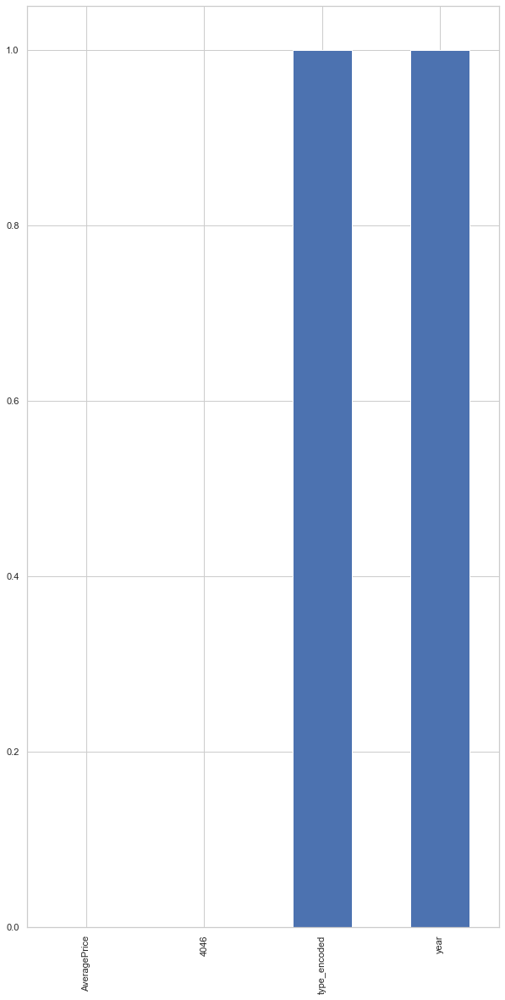

In [132]:
import numpy as np
from sklearn.utils import resample
x=x_frame11.copy()
y=final_dataframe['region_encoded']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)
X=pd.concat([x_train, y_train], axis=1)
not_good=X[X['region_encoded']==0]
not_good1=X[X['region_encoded']==1]
not_good2=X[X['region_encoded']==2]
not_good3=X[X['region_encoded']==3]
not_good4=X[X['region_encoded']==4]
not_good5=X[X['region_encoded']==5]
not_good6=X[X['region_encoded']==6]
not_good7=X[X['region_encoded']==7]
not_good8=X[X['region_encoded']==8]
not_good9=X[X['region_encoded']==9]
not_good10=X[X['region_encoded']==10]
not_good11=X[X['region_encoded']==11]
not_good12=X[X['region_encoded']==12]
not_good13=X[X['region_encoded']==13]
not_good14=X[X['region_encoded']==14]
not_good15=X[X['region_encoded']==15]
not_good16=X[X['region_encoded']==16]
not_good17=X[X['region_encoded']==17]
not_good18=X[X['region_encoded']==18]
not_good19=X[X['region_encoded']==19]
not_good20=X[X['region_encoded']==20]
not_good21=X[X['region_encoded']==21]
not_good22=X[X['region_encoded']==22]
not_good23=X[X['region_encoded']==23]
not_good24=X[X['region_encoded']==24]
not_good25=X[X['region_encoded']==25]
not_good26=X[X['region_encoded']==26]
not_good27=X[X['region_encoded']==27]
not_good28=X[X['region_encoded']==28]
not_good29=X[X['region_encoded']==29]
not_good30=X[X['region_encoded']==30]
not_good31=X[X['region_encoded']==31]
not_good32=X[X['region_encoded']==32]
not_good33=X[X['region_encoded']==33]
not_good34=X[X['region_encoded']==34]
not_good35=X[X['region_encoded']==35]
not_good36=X[X['region_encoded']==36]
not_good37=X[X['region_encoded']==37]
not_good38=X[X['region_encoded']==38]
not_good39=X[X['region_encoded']==39]
not_good40=X[X['region_encoded']==40]
not_good41=X[X['region_encoded']==41]
not_good42=X[X['region_encoded']==42]
not_good43=X[X['region_encoded']==43]
not_good44=X[X['region_encoded']==44]
not_good45=X[X['region_encoded']==45]
not_good46=X[X['region_encoded']==46]
not_good47=X[X['region_encoded']==47]
not_good48=X[X['region_encoded']==48]
not_good49=X[X['region_encoded']==49]
not_good50=X[X['region_encoded']==50]
not_good51=X[X['region_encoded']==51]
not_good52=X[X['region_encoded']==52]
good=X[X['region_encoded']==53]
good_upsampled=resample(good, replace=True, n_samples=len(not_good), random_state=0)
upsampled=pd.concat([not_good, not_good1, not_good2, not_good3, not_good4, not_good5, not_good6, not_good7, not_good8, not_good9, not_good10, not_good11, not_good12, not_good13, not_good14, not_good15, not_good16, not_good17, not_good18, not_good19, not_good20, not_good21, not_good22, not_good23, not_good24, not_good25, not_good26, not_good27, not_good28, not_good29, not_good30, not_good31, not_good32, not_good33, not_good34, not_good35, not_good36, not_good37, not_good38, not_good39, not_good40, not_good41, not_good42, not_good43, not_good44, not_good45, not_good46, not_good47, not_good48, not_good49, not_good50, not_good51, not_good52,good_upsampled])
x=upsampled.drop('region_encoded', axis=1)
y=upsampled['region_encoded']
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x,y,test_size=0.1)
print(upsampled['region_encoded'].value_counts())
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))
p_values=p_values[p_values<0.05]
p_values=pd.DataFrame(p_values, columns=['P Values'])
p_values['Features']=p_values.index
p_values=p_values[['Features', 'P Values']]
x=x[p_values['Features']]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)

# The above matrix represent balanced label vector with count of each region enlisted with region code. And the graph shoows new set of strong indicators based on p values, with variance threshold as low as 0.01 and confidence as 95%.

In [133]:
p_values

,Features,P Values
AveragePrice,AveragePrice,0.0
4046,4046,0.0


# Model 6

# RFC On Resampled Data With Intuitional Hyper Parameter Tuning

In [134]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [135]:
model1_prediction_train

,y_train,yhat
16940,41.0,48.0
6429,15.0,48.0
6501,16.0,48.0
7997,44.0,48.0
17255,47.0,48.0
...,...,...
2229,42.0,48.0
8263,49.0,48.0
11868,52.0,48.0
1811,34.0,48.0


In [136]:
model1_prediction_test

,y_test,yhat
1232,23.0,48.0
8723,20.0,48.0
5047,43.0,48.0
114,2.0,48.0
5833,4.0,48.0
...,...,...
2348,45.0,48.0
5105,44.0,48.0
9037,46.0,48.0
5891,5.0,48.0


In [137]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.02
Test Score:  0.02
Train Accuracy Score:  0.02
Test Accuracy Score:  0.02
Cross Validation Score:  0.02
Cross Validation Risk:  0.0


In [139]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred))
print(confusion_matrix(y_test, ytst_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        33
         1.0       0.00      0.00      0.00        27
         2.0       0.00      0.00      0.00        28
         3.0       0.00      0.00      0.00        34
         4.0       0.00      0.00      0.00        26
         5.0       0.00      0.00      0.00        24
         6.0       0.00      0.00      0.00        37
         7.0       0.00      0.00      0.00        27
         8.0       0.00      0.00      0.00        30
         9.0       0.00      0.00      0.00        26
        10.0       0.00      0.00      0.00        23
        11.0       0.00      0.00      0.00        38
        12.0       0.00      0.00      0.00        22
        13.0       0.00      0.00      0.00        32
        14.0       0.00      0.00      0.00        29
        15.0       0.00      0.00      0.00        30
        16.0       0.00      0.00      0.00        26
        17.0       0.00    

In [140]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [142]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
try:
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


# Model 7

# RFC On Resampled Data With Default Hyper Parameter Tuning

In [143]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [144]:
y_pred1

array([41., 15., 16., ..., 52., 34.,  2.])

In [145]:
ytst_pred1

array([21., 29., 10., ...,  6.,  6., 39.])

In [146]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.2
Train Accuracy Score:  1.0
Test Accuracy Score:  0.2
Cross Validation Score:  0.2
Cross Validation Risk:  0.01


In [147]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [148]:
from sklearn import metrics
y_pred_proba =rfc1.predict_proba(x_test)[::,1]
try:
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')        

Multi Class Format Is Not Supported For ROC Curve


# Model 8

# Support Vector Classifier with sigmoid to prevent overfitting on resampled data

In [151]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [152]:
y_pred5=clf.predict(x_train)
y_pred5

array([23., 23., 23., ..., 23.,  2., 23.])

In [153]:
ytst_pred5=clf.predict(x_test)
ytst_pred5

array([21., 23.,  2., ..., 48., 23.,  2.])

In [154]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train,y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.01
Test Score:  0.01
Train Accuracy Score:  0.01
Test Accuracy Score:  0.01
Cross Validation Score:  0.02
Cross Validation Risk:  0.0


In [155]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred5))
print(confusion_matrix(y_test,ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        33
         1.0       0.00      0.00      0.00        27
         2.0       0.01      0.14      0.02        28
         3.0       0.00      0.00      0.00        34
         4.0       0.00      0.00      0.00        26
         5.0       0.00      0.00      0.00        24
         6.0       0.00      0.00      0.00        37
         7.0       0.00      0.00      0.00        27
         8.0       0.00      0.00      0.00        30
         9.0       0.00      0.00      0.00        26
        10.0       0.00      0.00      0.00        23
        11.0       0.00      0.00      0.00        38
        12.0       0.00      0.00      0.00        22
        13.0       0.00      0.00      0.00        32
        14.0       0.00      0.00      0.00        29
        15.0       0.00      0.00      0.00        30
        16.0       0.00      0.00      0.00        26
        17.0       0.00    

In [156]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is turned off for model development.')

Graph cannot be generated because probability is turned off for model development.


# Best Models are saved in pickle

# Conclusion
Best models are.

# Model 3: RFC With Grid Search CV

    Train Score:  1.0

    Test Score:  0.2

    Train Accuracy Score:  1.0

    Test Accuracy Score:  0.2


# Model 4:  Bagging Classifier With Grid Search CV Hyper Parameter Tuning

    Train Score:  1.0

    Test Score:  0.2

    Train Accuracy Score:  1.0

    Test Accuracy Score:  0.2

# Please note, metrics calculation is explained above while development and evaluation.

# Credits:
DataTrained and Python Documentations.

# Evaluation Project 3: Subpart 2

# Avocado Regression Predictive Analysis, Model Development, Model Evaluation and Model Selection Project

# Avocado Project is a regression based problem statement to predict average price from several indicators. This dataset utilizes data from weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados. 

# Importing Data From Github repository dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/avocado.csv.zip

In [152]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('avocado.csv',index_col='Date',parse_dates=['Date'])
data=data.sort_index()
data1=pd.read_csv('avocado.csv', index_col=0)
data1=data1.reset_index(drop=True)
data=data.drop('Unnamed: 0', axis=1)
data

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,
2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.00,organic,2015,Southeast
2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.00,organic,2015,Chicago
2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.00,organic,2015,HarrisburgScranton
2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.00,conventional,2015,Pittsburgh
2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.00,organic,2015,Boise
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-25,1.36,908202.13,142681.06,463136.28,174975.75,127409.04,103579.41,22467.04,1362.59,conventional,2018,Chicago
2018-03-25,0.70,9010588.32,3999735.71,966589.50,30130.82,4014132.29,3398569.92,546409.74,69152.63,conventional,2018,SouthCentral
2018-03-25,1.42,163496.70,29253.30,5080.04,0.00,129163.36,109052.26,20111.10,0.00,organic,2018,SouthCentral


In [153]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  18249 Number Of Columns:  12


# Data Cleaning

In [154]:
data.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region'],
      dtype='object')

In [155]:
data=data.rename(columns={'R':'Runs', 'AB':'At Bats', 'H':'Hits', '2B':'Doubles', '3B':'Triples', 'HR':'Homeruns', 'BB':'Walks', 'SO':'Strikeouts', 'SB':'Stolen Bases', 'RA':'Runs Allowed', 'ER':'Earned Runs', 'ERA':'Earned Run Average (ERA)', 'SHO':'Shutouts', 'SV':'Saves', 'CG':'Complete Games', 'E':'Errors', 'W':'Number of predicted wins'})
data

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,
2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.00,organic,2015,Southeast
2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.00,organic,2015,Chicago
2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.00,organic,2015,HarrisburgScranton
2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.00,conventional,2015,Pittsburgh
2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.00,organic,2015,Boise
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-25,1.36,908202.13,142681.06,463136.28,174975.75,127409.04,103579.41,22467.04,1362.59,conventional,2018,Chicago
2018-03-25,0.70,9010588.32,3999735.71,966589.50,30130.82,4014132.29,3398569.92,546409.74,69152.63,conventional,2018,SouthCentral
2018-03-25,1.42,163496.70,29253.30,5080.04,0.00,129163.36,109052.26,20111.10,0.00,organic,2018,SouthCentral


In [156]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [157]:
data.isna().any()

AveragePrice    False
Total Volume    False
4046            False
4225            False
4770            False
Total Bags      False
Small Bags      False
Large Bags      False
XLarge Bags     False
type            False
year            False
region          False
dtype: bool

In [158]:
data.isna().values.any()

False

In [159]:
data.isnull().values.sum()

0

In [160]:
data.dtypes, len(data.dtypes)

(AveragePrice    float64
 Total Volume    float64
 4046            float64
 4225            float64
 4770            float64
 Total Bags      float64
 Small Bags      float64
 Large Bags      float64
 XLarge Bags     float64
 type             object
 year              int64
 region           object
 dtype: object,
 12)

# Tabulated Conclusion Of Data Cleaning

In [161]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18249 entries, 2015-01-04 to 2018-03-25
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   XLarge Bags   18249 non-null  float64
 9   type          18249 non-null  object 
 10  year          18249 non-null  int64  
 11  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(2)
memory usage: 1.8+ MB


# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
1. The dataset has no missing values, therefore imputation and filling data are not required.
2. The whole dataset is of 30*17, hence, chances of underfitting, that is, model getting trained less than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 17 continuous columns and 0 categorical columns, hence, encoding is not required.

# Dataset Visualization                                                                                                     

# Head View

In [162]:
data.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,
2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.0,organic,2015,Southeast
2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.0,organic,2015,Chicago
2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.0,organic,2015,HarrisburgScranton
2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.0,conventional,2015,Pittsburgh
2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.0,organic,2015,Boise


# The above table represents first five rows of original dataset

# Sample View

In [163]:
data.sample()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,
2015-08-23,1.28,128681.94,4847.16,72826.86,5459.79,45548.13,40204.96,4716.36,626.81,conventional,2015,GrandRapids


# The above table represents a random row as sample row from the dataset

# Tail View

In [164]:
data.tail()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,
2018-03-25,1.36,908202.13,142681.06,463136.28,174975.75,127409.04,103579.41,22467.04,1362.59,conventional,2018,Chicago
2018-03-25,0.70,9010588.32,3999735.71,966589.50,30130.82,4014132.29,3398569.92,546409.74,69152.63,conventional,2018,SouthCentral
2018-03-25,1.42,163496.70,29253.30,5080.04,0.00,129163.36,109052.26,20111.10,0.00,organic,2018,SouthCentral
2018-03-25,1.70,190257.38,29644.09,70982.10,0.00,89631.19,89424.11,207.08,0.00,organic,2018,California
2018-03-25,1.34,1774776.77,63905.98,908653.71,843.45,801373.63,774634.09,23833.93,2905.61,conventional,2018,NewYork


# The above table represents last five rows of the dataframe.

# Feature Engineering

# Encoding

In [165]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data1.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data1.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,Date_encoded,type_encoded,region_encoded
0,51.0,0.0,0.0
1,50.0,0.0,0.0
2,49.0,0.0,0.0
3,48.0,0.0,0.0
4,47.0,0.0,0.0
...,...,...,...
18244,161.0,1.0,53.0
18245,160.0,1.0,53.0
18246,159.0,1.0,53.0
18247,158.0,1.0,53.0


# Concatenating Original Data With Encoded Data

In [166]:
data=pd.concat([data1, encoded_data], axis=1, ignore_index=False)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,47.0,0.0,0.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [167]:
final_dataframe=data.copy()
final_dataframe

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,2018,158.0,1.0,53.0


# The above table is the final dataframe that summarizes all the 3 derived dataframes with original dataframe. Hence, adding to the number of available featres to make more informed and accurate prediction.

In [168]:
len(final_dataframe.columns.unique())

13

# The number of columns have increase from 17 to 68 (17*4).

In [169]:
final_dataframe.isna().values.any()

False

In [170]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

# There are no null and missing values in final dataframe.

# EDA Part 1

In [64]:
final_dataframe[:10]

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,47.0,0.0,0.0
5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,2015,46.0,0.0,0.0
6,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.0,2015,45.0,0.0,0.0
7,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.0,2015,44.0,0.0,0.0
8,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.0,2015,43.0,0.0,0.0
9,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.0,2015,42.0,0.0,0.0


# The above table represents first 10 rows from final dataframe.

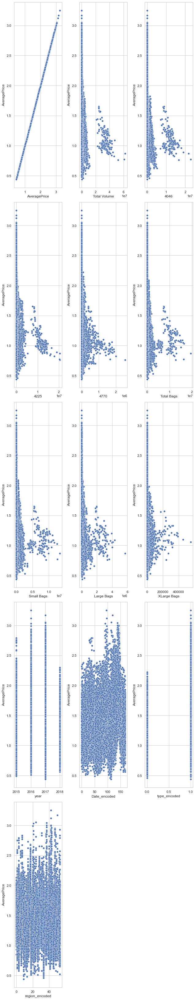

In [65]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(final_dataframe[colist[x]], y='AveragePrice', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that 

# 1. distribution is mostly evenly distributed for most of the columns. For example, 

    i. Date encoded

    ii. type encoded

    iii. year

# 2. A few outliers are found in:
    i. Region Encoded in price range around 3.

# 3. Many outliers are detected in all other columns:
    i. Total Volume: outliers found within and outside price range 1 and 1.5

    ii. 4046: outliers found within and outside price range 1 and 1.5

    iii. 4225: outliers found within and outside price range 1 and 1.5

    iv. 4770: outliers found within and outside price range 1 and 1.5

    v. Total Bags: outliers found within and outside price range 1 and 1.5

    vi. X Large Bags: outliers found within and outside price range 1 and 1.5

    vii. Large Bags: outliers found within and outside price range 1 and 1.5

    viii. Small Bags: outliers found within and outside price range 1 and 1.5


# Anomalies:

    Price Ranges 1 to 1.5 are making the data biased.

    Category 1 of Avacado was priced more than category 0.

    Average price reach peak in 2016.

    Average price reach trough in 2017.

    Average price reached highest for dates encoded in the range 100 to 150.

# Q&A Answered:

    Price at which Avacado was available in most of the regions: 1 to 2

    Maximum Type Of Bags Utilized: XLarge Bags (in range 400000).

    Maximum Price: 3

    Maximum Volume Was Seen At Which Price (~): ~1

    Region with maximum price for each avacado: 41

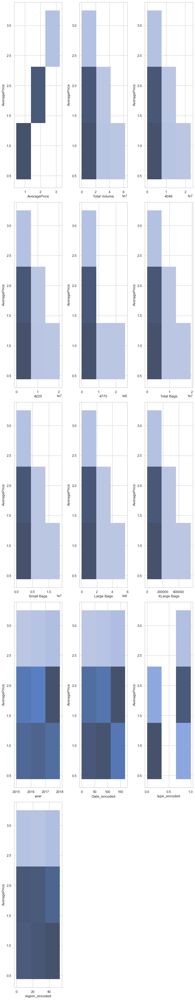

In [66]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='AveragePrice', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features agains label. It is divided into 3 bins. Only Average Price seems to be close to normal with skewness threshold within +/-0.65. Normal distribution has 0 skewness.

# 1. The entire dataframe against average price has skewness 0.58 and kurtosis 0.33, indicating high abnormalities with region encoded as label. It reflects right skewed and platykurtic data.

# 2. 3 columns have 0 skewness (as desired in normal distribution):

    i. region_encoded,

    ii. date_encoded,

    iii. year.

# 3. Moderate skewness is observed in year.

# 4. High skewness is observed in sales and total volume.

# 5. Action Plan From Above Anomalies:
    Requires outliers removal and transgormation to save adequately informative data for predictive development.

    Requires data scaling to normalize the existing columns and hence removing abnormally widespread data points.

# 6. Q&A Answered:
    Average Price Range: 0 to 3 for all the regions, distribution is normal.

    Which is more expensive Avacado: Type 1.

    Average Price is higher for what amount of sales: less than 1 for all psu series.

    Average Price is higher for how many units of volume: upto 2.

# Correlation Analysis

# Mathematical Notation:¶
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

In [67]:
final_dataframe.corr()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
AveragePrice,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.093197,0.145514,0.615845,-0.011716
Total Volume,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,0.017193,0.009263,-0.232434,0.174176
4046,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,0.003353,-0.005028,-0.225819,0.192073
4225,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.009559,-0.016895,-0.232289,0.145726
4770,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.036531,-0.047517,-0.210027,0.095252
Total Bags,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,0.071552,0.064688,-0.217788,0.175256
Small Bags,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,0.063915,0.056902,-0.220535,0.164702
Large Bags,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,0.087891,0.081855,-0.193177,0.198768
XLarge Bags,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,0.081033,0.077374,-0.175483,0.082281
year,0.093197,0.017193,0.003353,-0.009559,-0.036531,0.071552,0.063915,0.087891,0.081033,1.000000,0.950274,-0.000032,-0.000055


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of Total Volume, Sales, Total Bags, breakdown of sizes of bags; that show strong correlation between each other. Other than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

# Correlation Heatmap Of Original Dataset

<AxesSubplot:>

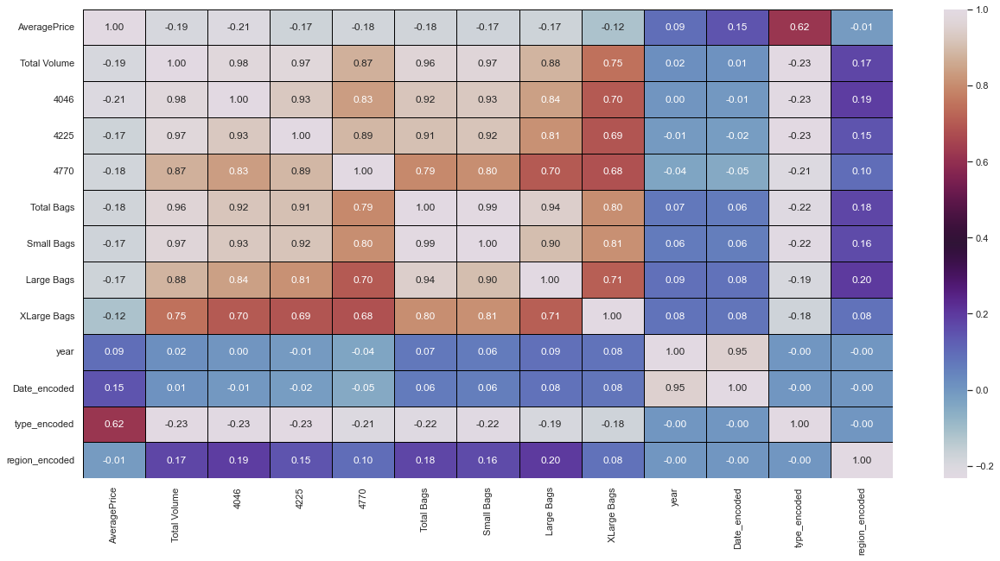

In [69]:
plt.figure(figsize=(21,10))
sns.heatmap(final_dataframe.corr(), annot=True, linewidths=0.5, linecolor='black', fmt='.2f', cmap='twilight')

# Verbal Translation Of Above Graph:
# 1. Label has moderate negative relationship with 4 features:
    i. Total Volume

    ii. 4046

    iii. 4225

    iv. 4770

    v. Total Bags

    vi. Small Bags

    vii. Large Bags

    viii. XLarge Bags

# 2. Label has moderate positive relationship with these features in this heatmap:
    i. year

    ii. Date_encoded

    iii. type_encoded

    iv. region_encoded

# 3. Strong Multicollinearity is detected among 5 features:
    i. Total Volume

    ii. 4046

    iii. 4225

    iv. 4770

    v. Total Bags

    vi. Small Bags

    vii. Large Bags

    viii. XLargeBags
# 4. Multicollinearity seems to be moderate among all other data points.

# Graphical Representation Of Correlation Of Features With Label

In [68]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame(final_dataframe.corr()['AveragePrice']).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with label is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:
# 1. Highest correlation with label is observed to be 61.59%, that is shared with type_encoded. Minimum correlation is -20.83%, shared with 4046 psu sales.
# 2. Weak Negative Relationship Is Found With Following Features:
    4046             -0.208317
    Total Volume     -0.192752
    4770             -0.179446
    Total Bags       -0.177088
    Small Bags       -0.174730
    Large Bags       -0.172940
    4225             -0.172928
    XLarge Bags      -0.117592
    region_encoded   -0.011716
# 3. Weak Positive To Strong Positive Relationship Is Found With Following Features:
    year              0.093197
    Date_encoded      0.145514
    type_encoded      0.615845
# 4. Correlation Of Label with itself is of no relevance

# Overall Conclsuion Of Correlation Analysis

# Overall correlation among dataset. There seems some multicollinearity due to presence of Job Level and Age; Marital Status Encoded and Stock Option Level; that show strong correlation between each other. Other than these columns there seems modest collinearity among features. We will do further eda befor arriving at a conclusion to delete these columns.
# 1. The most useful feature is Average Price, apart from this, there seems modest correlation of features with label.
# 2. As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:
    i. Total Volume

    ii. 4046

    iii. 4225

    iv. 4770

    v. Total Bags

    vi. Small Bags

    vii. Large Bags

    viii. XLargeBags
# 3. Highest Bias (Multicollinearity) is observed in Total Volume.¶


# Dataset Information Table

In [70]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   AveragePrice    18249 non-null  float64
 1   Total Volume    18249 non-null  float64
 2   4046            18249 non-null  float64
 3   4225            18249 non-null  float64
 4   4770            18249 non-null  float64
 5   Total Bags      18249 non-null  float64
 6   Small Bags      18249 non-null  float64
 7   Large Bags      18249 non-null  float64
 8   XLarge Bags     18249 non-null  float64
 9   year            18249 non-null  int64  
 10  Date_encoded    18249 non-null  float64
 11  type_encoded    18249 non-null  float64
 12  region_encoded  18249 non-null  float64
dtypes: float64(12), int64(1)
memory usage: 1.8 MB


# The above table reprents information dataset:
    
i. Columns

ii. Count Of Non Null Data Points

iii. Values data type for each columns

iv. Count of data types in iii.

v. Memory Usage

# It can be deduced that the dataset has 18249 rows and each columns has no missing values. The datatypes used are float64 and int64. There 12 float64 columns and 1 int64 column. Memory usage is 1.8MB

# Names of all the columns

In [71]:
final_dataframe.select_dtypes(include = [np.number]).columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'Date_encoded',
       'type_encoded', 'region_encoded'],
      dtype='object')

# The above code cell highlights all numeric values, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [72]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
for x in colist:
    try:
        plot = px.violin(x=x, y=final_dataframe['AveragePrice'])
        plot.show()
    except ValueError:
        print('{0} vales out of range, try skewness function to detect outliers'.format(x))
        continue

AveragePrice vales out of range, try skewness function to detect outliers
Total Volume vales out of range, try skewness function to detect outliers
4046 vales out of range, try skewness function to detect outliers
4225 vales out of range, try skewness function to detect outliers
4770 vales out of range, try skewness function to detect outliers
Total Bags vales out of range, try skewness function to detect outliers
Small Bags vales out of range, try skewness function to detect outliers
Large Bags vales out of range, try skewness function to detect outliers
XLarge Bags vales out of range, try skewness function to detect outliers
year vales out of range, try skewness function to detect outliers
Date_encoded vales out of range, try skewness function to detect outliers
type_encoded vales out of range, try skewness function to detect outliers
region_encoded vales out of range, try skewness function to detect outliers


# Verbal Translation Of Above Graph¶
The data seems to be biased, as analyzed above. I has values scattered beyond acceptable range and hence it cannot be plotted. We go through descriptive stats for furtheranalysis.

# Descriptive Statistics

In [73]:
description=final_dataframe.describe()
description

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,83.997096,0.499918,26.495644
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,48.787638,0.500014,15.583788
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,0.000000,0.000000,0.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,42.000000,0.000000,13.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,84.000000,0.000000,26.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,126.000000,1.000000,40.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,168.000000,1.000000,53.000000


In [74]:
lst=description.columns.to_list()
print(lst)

['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'Date_encoded', 'type_encoded', 'region_encoded']


In [75]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[0.2899999999999998], [325585.52999999997], [102374.9], [121145.83999999998], [6058.43], [71039.54], [56974.85], [19381.54], [132.5], [1.0], [42.0], [1.0], [14.0]]


(13, None)

In [76]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
IQR,0.29,325585.53,102374.9,121145.84,6058.43,71039.54,56974.85,19381.54,132.5,1.0,42.0,1.0,14.0


In [77]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[2.81], [62505561.96], [22743616.17], [20470572.61], [2546439.11], [19373134.37], [13384586.8], [5719096.61], [551693.65], [3.0], [168.0], [1.0], [53.0]]


(13, None)

In [78]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
Range,2.81,62505561.96,22743616.17,20470572.61,2546439.11,19373134.37,13384586.8,5719096.61,551693.65,3.0,168.0,1.0,53.0


In [79]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(          AveragePrice  Total Volume     4046      4225       4770  \
 Skewness      0.580303      9.007687  8.64822  8.942466  10.159396   
 
           Total Bags  Small Bags  Large Bags  XLarge Bags      year  \
 Skewness    9.756072     9.54066    9.796455    13.139751  0.215339   
 
           Date_encoded  type_encoded  region_encoded  
 Skewness      0.000117      0.000329         0.00003  ,
           AveragePrice  Total Volume       4046       4225        4770  \
 Kurtosis      0.325196     92.104458  86.809113  91.949022  132.563441   
 
           Total Bags  Small Bags  Large Bags  XLarge Bags      year  \
 Kurtosis  112.272156  107.012885  117.999481   233.602612 -1.032747   
 
           Date_encoded  type_encoded  region_encoded  
 Kurtosis     -1.200036     -2.000219       -1.200783  )

In [80]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Date_encoded,type_encoded,region_encoded
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,83.997096,0.499918,26.495644
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,48.787638,0.500014,15.583788
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,0.000000,0.000000,0.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,42.000000,0.000000,13.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,84.000000,0.000000,26.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,126.000000,1.000000,40.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,168.000000,1.000000,53.000000
IQR,0.290000,3.255855e+05,1.023749e+05,1.211458e+05,6.058430e+03,7.103954e+04,5.697485e+04,1.938154e+04,132.500000,1.000000,42.000000,1.000000,14.000000
Range,2.810000,6.250556e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,3.000000,168.000000,1.000000,53.000000


# Graphical Representation Of Above Table

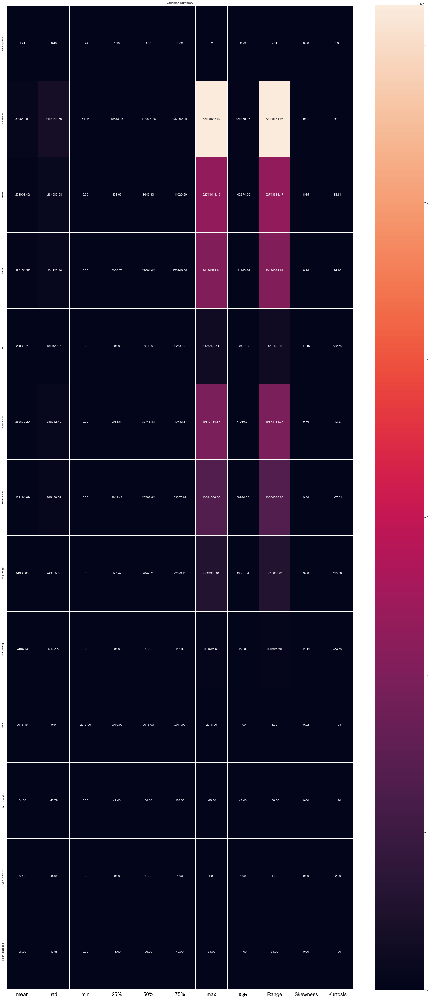

In [81]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, color='Black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=10, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic¶
# For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

# The entire dataset ranges from 0 till 62505646.52.

# IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

# Skewness is 0 and within +/- 0.65 for:

# The entire dataframe against region encoded has skewness 3 and kurtosis -1.2, indicating high abnormalities with region encoded as label. It reflects right skewed and platykurtic data.

# 3 columns have 0 skewness (as desired in normal distribution):

    i. region_encoded,

    ii. date_encoded,

    iii. type_encoded.

# Moderate skewness is observed in year.

# High skewness is observed in sales and total volume.

# Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

# Kurtosis is upto 3 for most dataset, indicating platykurtic curves.

# Kurtosis is greater than 3, indicating, leptokurtic curve for:

    Total Volume 92.104458

    4046 86.809113

    4225 91.949022

    4770 132.563441

    Total Bags 112.272156

    Small Bags 107.012885

    Large Bags 117.999481

    XLarge Bags 233.602612

# Kurtosis should be 3 for bell shaped curve.

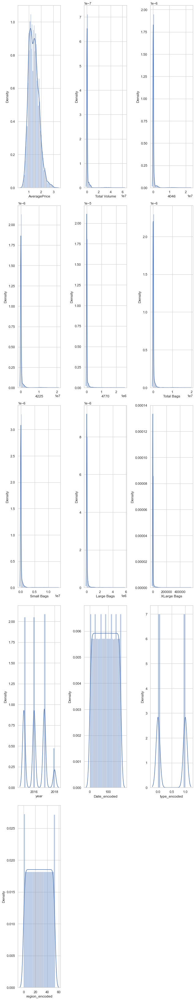

In [82]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations
# 1. Acceptable skewness is +/-0.65 and Right skewness for bell shaped curve is 0
# 2. Acceptable And Outliers Prone Right Skewness is observed in:
    region_encoded     0.000030

    Date_encoded       0.000117

    type_encoded       0.000329

    year               0.215339

    AveragePrice       0.580303

    4046               8.648220

    4225               8.942466

    Total Volume       9.007687

    Small Bags         9.540660

    Total Bags         9.756072

    Large Bags         9.796455

    4770              10.159396

    XLarge Bags       13.139751
# 3. Bell Shaped Curve (O skewness) is observed in:
    None of the columns

# Conclusion:
# Based On EDA done above in two parts, I am romving 2 columns, as part of Error Removal And Data Handling:
    XLarge Bags,

    4770, 

    Large Bags, 

    Total Bags, 

    Small Bags.

# Error Removal And Data Handling

# Based On EDA done above in two parts, I am romving 2 columns, as part of Error Removal And Data Handling:
    XLarge Bags,

    4770, 

    Large Bags, 

    Total Bags, 

    Small Bags.
# Although, Total Volume is detected to have large multicollinearity bias, it has low skewness and hence, I will filter it through variance filter and then hypothesis test on it. Based on final p values, I make a conclusion about Total Volume and other remaining columns.

In [171]:
final_dataframe=final_dataframe.drop(['XLarge Bags', '4770', 'Large Bags', 'Total Bags', 'Small Bags'], axis=1)
final_dataframe

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,2018,158.0,1.0,53.0


# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

# Z Score: Outliers Treatment

In [172]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(0)
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(18249, 8)

In [173]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([  346,   359,  1516,  1518,  1541,  2368,  2370,  2652,  2652,
        2652,  2653,  2653,  2653,  2654,  2654,  2654,  2655,  2655,
        2655,  2656,  2656,  2656,  2657,  2657,  2657,  2658,  2658,
        2658,  2659,  2659,  2659,  2660,  2660,  2660,  2661,  2661,
        2661,  2662,  2662,  2662,  2663,  2663,  2663,  2664,  2664,
        2664,  2665,  2665,  2665,  2666,  2666,  2666,  2667,  2667,
        2667,  2668,  2668,  2668,  2669,  2669,  2669,  2670,  2670,
        2670,  2671,  2671,  2671,  2672,  2672,  2672,  2673,  2673,
        2673,  2674,  2674,  2674,  2675,  2675,  2675,  2676,  2676,
        2676,  2677,  2677,  2677,  2678,  2678,  2678,  2679,  2679,
        2679,  2680,  2680,  2680,  2681,  2681,  2681,  2682,  2682,
        2682,  2683,  2683,  2683,  2684,  2684,  2684,  2685,  2685,
        2685,  2686,  2686,  2686,  2687,  2687,  2687,  2688,  2688,
        2688,  2689,  2689,  2689,  2690,  2690,  2690,  2691,  2691,
        2691,  2692

# The above cell displays outlier values.

In [174]:
len(np.where(score>3)[0])

663

# The cell above shows number of outliers.

In [175]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,2018,158.0,1.0,53.0


# The above table shows the final dataframe after removing outliers, 663 rows are removed and resultant dimension is 17926 rows * 8 columns

# IQR Method Of Outliers Removal

# Since, many rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [176]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [177]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
18244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [178]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [179]:
new_df=new_df.fillna(method='bfill')
new_df

,AveragePrice,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,1.33,64236.62,1036.74,54454.85,2015,51.0,0.0,0.0
1,1.35,54876.98,674.28,44638.81,2015,50.0,0.0,0.0
2,0.93,118220.22,794.70,109149.67,2015,49.0,0.0,0.0
3,1.08,78992.15,1132.00,71976.41,2015,48.0,0.0,0.0
4,1.28,51039.60,941.48,43838.39,2015,47.0,0.0,0.0
...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,1529.20,2018,161.0,1.0,53.0
18245,1.71,13888.04,1191.70,3431.50,2018,160.0,1.0,53.0
18246,1.87,13766.76,1191.92,2452.79,2018,159.0,1.0,53.0
18247,1.93,16205.22,1527.63,2981.04,2018,158.0,1.0,53.0


# The above table displays the final dataframe after IQR  treatment, since this method restores all the rows. It signifies that outliers are not very much spread and can be treated with power transform method.

# I prefer ZScore+ Power Transform in this case because outliers are very significant in particular regions and dataset is quite large, indicating, possibility of overfitting.
# It would be prudent to remove some rows with outliers and then perform outliers transformation of remaining data for better pre processing.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

label=Average Price.

In [180]:
x=data_new.drop(['AveragePrice'], axis=1)
y=data_new['AveragePrice']
x.sample()

,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
16155,7063.97,582.27,3204.62,2017,120.0,1.0,26.0


# The above table displays a sample of features vector.

In [181]:
y.sample()

11480    1.53
Name: AveragePrice, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [182]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,Total Volume,4046,4225,year,Date_encoded,type_encoded,region_encoded
0,-0.096566,-0.669906,0.319575,0.0,-0.575792,-1.003241,-2.013763
1,-0.167293,-0.788143,0.239629,0.0,-0.598075,-1.003241,-2.013763
2,0.178006,-0.743299,0.609808,0.0,-0.620486,-1.003241,-2.013763
3,-0.003600,-0.645411,0.434015,0.0,-0.643027,-1.003241,-2.013763
4,-0.199829,-0.696632,0.232417,0.0,-0.665702,-1.003241,-2.013763
...,...,...,...,...,...,...,...
17921,-0.689589,-0.477357,-0.934826,0.0,1.442833,0.996770,1.565560
17922,-0.781630,-0.631038,-0.682589,0.0,1.426845,0.996770,1.565560
17923,-0.785535,-0.630986,-0.789434,0.0,1.410828,0.996770,1.565560
17924,-0.712890,-0.561033,-0.727731,0.0,1.394782,0.996770,1.565560


# The above table displays outliers transformed values as discussed above.

In [183]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [184]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,3])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[1.66884041, 1.08113598, 1.75206668, ..., 1.25411134, 0.        ,
        0.        ],
       [1.62839043, 1.00232666, 1.70401526, ..., 1.23584427, 0.        ,
        0.        ],
       [1.82587247, 1.03221678, 1.92651059, ..., 1.21747285, 0.        ,
        0.        ],
       ...,
       [1.2748072 , 1.10707725, 1.08549833, ..., 2.88266583, 3.        ,
        3.        ],
       [1.31635448, 1.15370319, 1.12258459, ..., 2.86951189, 3.        ,
        3.        ],
       [1.33580022, 1.27664004, 1.07792789, ..., 2.8563339 , 3.        ,
        3.        ]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 0 to 3 because that is regression range, hence, model performance can be sound.

In [185]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [186]:
x_frame1.values.max()

3.0000000000000004

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

In [187]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
0,159.583538,Total Volume
2,66.649166,4225
1,38.292855,4046
4,5.941425,Date_encoded
6,5.287810,region_encoded
5,2.258380,type_encoded
3,NaN,year


In [188]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
0,159.583538,Total Volume
2,66.649166,4225
1,38.292855,4046


In [189]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['Total Volume', '4225', '4046'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
1,3.118675,Date_encoded
3,3.113913,region_encoded
2,1.818242,type_encoded
0,NaN,year


# Since, all the vif scores are below 6, I can pass the listed features for feature selection

# Data Handling Conclusion

# Concluding Points:
# 1. As part of data handling, I have removed features with high outliers (by analyzing box plots, dist plots, variable plot, scatter plots and descriptive plots).
# 2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.
# 3. Hence, the model can be expected to be low bias model.

# Feature Selection

In [190]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [191]:
x.shape, y.shape

((17926, 7), (17926,))

In [192]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train with randomness value as 100.

In [193]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those.

<AxesSubplot:>

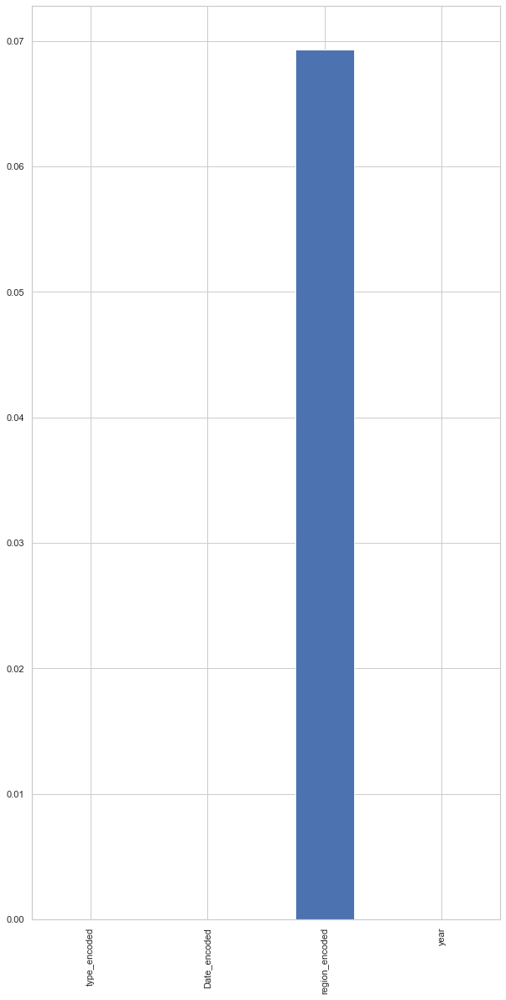

In [194]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [195]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['type_encoded', 'Date_encoded'], dtype='object')

# P Values are an important component of feature selection, with significance level set to 0.1, Variance Threshold
    ensemble technique returns with 90% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.1 are:
Index(['type_encoded', 'Date_encoded'], dtype='object')

In [196]:
import numpy as np
x=x_frame1.copy()
x=x[['type_encoded', 'Date_encoded']]
x.sample()

,type_encoded,Date_encoded
16347,3.0,2.655637


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [197]:
y.sample()

12605    0.86
Name: AveragePrice, dtype: float64

# The above series displays a sample of label.

In [198]:
x.shape, y.shape

((17926, 2), (17926,))

# The above cell displays final shapes of x and y vectors

In [199]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [200]:
x_train.shape, y_train.shape

((7170, 2), (7170,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Models =5)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven data points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve a goodness of fit. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low).

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is decision tree regressor and hence, is again a very powerful implementation to prevent illness of fit.

# Model 1

# Extra Tree Regressor With Default HyperParameter Tuning

In [202]:
from sklearn.ensemble import RandomForestRegressor as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
import pickle
best_estim=ExtraTreesRegressor()
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
mse2 = mean_squared_error(y_train, y_pred2)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
rmse2=np.sqrt(mse2)
ytst_pred2=best_estim.predict(x_test)
mse_test2=mean_squared_error(y_test, ytst_pred2)
rmse_test2=np.sqrt(mse_test2)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [203]:
print('Train Score: ',np.round(model3_train_score,2))
print('Test Score: ',np.round(model3_test_score,2))
print('MSE Train: ',np.round(mse2,2))
print('RMSE Train: ',np.round(rmse2,2))
print('MSE Test: ',np.round(mse_test2,2))
print('RMSE Train: ',np.round(rmse_test2,2))

Train Score:  0.56
Test Score:  0.5
MSE Train:  0.07
RMSE Train:  0.26
MSE Test:  0.07
RMSE Train:  0.27


In [204]:
model3_save=pickle.dumps(best_estim) #saving the best model


# Model 2

# Random Forest Regressor With Default Hyper Parameter Tuning

In [205]:
from sklearn.ensemble import RandomForestRegressor as el
from sklearn.model_selection import cross_val_score
rfc=el()
rfc.fit(x_train, y_train)
print(rfc.score(x_train, y_train))
print(rfc.score(x_test, y_test))
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
print(scores.std())
print(cv_scores)

0.5615188349113112
0.49647895956212107
0.2915686361020181
0.11340266785679251


In [206]:
train_prediction=rfc.predict(x_train)
test_prediction=rfc.predict(x_test)

In [207]:
mse_train = mean_squared_error(y_train, train_prediction)
mse = mean_squared_error(y_test, test_prediction)
rmse_train = np.sqrt(mse_train)
rmse = np.sqrt(mse)
mse_train, mse, rmse_train, rmse

(0.06594344286282035,
 0.07484507618647318,
 0.25679455380288024,
 0.2735782816425185)

# Model 3

# Ada Boost Regressor And Random Forest Regressor With Grid Search CV Hyper Parameter Tuning and Ada Boost Boosting

In [133]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
import matplotlib.pyplot as plt
abreg = AdaBoostRegressor()
params = {
 'n_estimators': [50, 100],
 'learning_rate' : [0.01, 0.05, 0.1, 0.5],
 'loss' : ['linear', 'square', 'exponential']
 }
score = make_scorer(mean_squared_error)
print(score)

make_scorer(mean_squared_error)


In [134]:
gridsearch=GridSearchCV(abreg, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
GridSearchCV(cv=5, error_score='raise', estimator=AdaBoostRegressor(base_estimator=rfc, learning_rate=1.0,loss='linear', n_estimators=50, random_state=None), n_jobs=1, param_grid={'n_estimators': [50, 100],'learning_rate': [0.01, 0.05, 0.1, 0.5],'loss': ['linear', 'square', 'exponential']},pre_dispatch='2*n_jobs', refit=True, return_train_score=True,scoring=None, verbose=0) 

GridSearchCV(cv=5, error_score='raise',
             estimator=AdaBoostRegressor(base_estimator=RandomForestRegressor()),
             n_jobs=1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.5],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [50, 100]},
             return_train_score=True)

In [135]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'learning_rate': 0.5, 'loss': 'exponential', 'n_estimators': 100}
0.47410603880940033


In [136]:
best_estim=gridsearch.best_estimator_
print(best_estim)

AdaBoostRegressor(learning_rate=0.5, loss='exponential', n_estimators=100)


In [137]:
best_estim.fit(x_train,y_train)

ytr_pred=best_estim.predict(x_train)
mse = mean_squared_error(y_train, ytr_pred)
print('Train Score: ', best_estim.score(x_train, y_train))
print('Test score: ', best_estim.score(x_test, y_test))

Train Score:  0.4770926137297147
Test score:  0.4721915244688545


In [138]:
ytst_pred=best_estim.predict(x_test)
print('mse_train', mse)
print('rmse_train', np.sqrt(mse))
mse_test = mean_squared_error(y_test, ytst_pred)
print('mse_test', mse_test)
print('rmse_test', np.sqrt(mse_test))

mse_train 0.07868164973815589
rmse_train 0.28050249506582986
mse_test 0.07840433758685666
rmse_test 0.2800077455836832


# Model 4

# Extra Trees Regressor With Grid Search CV Hyper Parameter Tuning

In [144]:
import sklearn
abreg = sklearn.ensemble.ExtraTreesRegressor()
params = {
 'n_estimators': [50, 100],
 'max_samples' : [0.01, 0.05, 0.1],
 'bootstrap' : [True],
 'oob_score' : [True],
 'warm_start' : [True],
 'n_jobs'  : [1,-1],
 'random_state' : [0,10,100,1000],
 'criterion' : ['squared_error', 'absolute_error'] 
 }
score = make_scorer(mean_squared_error)
print(score)

make_scorer(mean_squared_error)


In [145]:
gridsearch=GridSearchCV(abreg, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'bootstrap': [True],
                         'criterion': ['squared_error', 'absolute_error'],
                         'max_samples': [0.01, 0.05, 0.1],
                         'n_estimators': [50, 100], 'n_jobs': [1, -1],
                         'oob_score': [True],
                         'random_state': [0, 10, 100, 1000],
                         'warm_start': [True]},
             return_train_score=True)

In [146]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'absolute_error', 'max_samples': 0.05, 'n_estimators': 100, 'n_jobs': 1, 'oob_score': True, 'random_state': 10, 'warm_start': True}
0.5103009926510792


In [147]:
best_estim=gridsearch.best_estimator_
print(best_estim)

ExtraTreesRegressor(bootstrap=True, criterion='absolute_error',
                    max_samples=0.05, n_jobs=1, oob_score=True, random_state=10,
                    warm_start=True)


In [148]:
best_estim.fit(x_train,y_train)

ytr_pred=best_estim.predict(x_train)
yts_pred=best_estim.predict(x_test)
mse = mean_squared_error(y_train, ytr_pred)
print('Train Score: ', best_estim.score(x_train, y_train))
print('Test score: ', best_estim.score(x_test, y_test))
print('mse_train: ', mse)
print('rmse_train', np.sqrt(mse))
mse_test=mean_squared_error(y_test, yts_pred)
print('mse_train: ', mse_test)
print('rmse_train', np.sqrt(mse_test))

Train Score:  0.5396045417569374
Test score:  0.5149199985260599
mse_train:  0.06927550678695955
rmse_train 0.2632024064991799
mse_train:  0.0720571532200632
rmse_train 0.2684346349114868


In [209]:
model3_save=pickle.dumps(best_estim) #saving the best model

# Model5

# Decision Tree Regressor With Default Hyper Parameter Tuning

In [149]:
from sklearn.tree import DecisionTreeRegressor
tree=DecisionTreeRegressor()
tree.fit(x_train, y_train)

DecisionTreeRegressor()

In [150]:
tree.score(x_test, y_test)

0.5071383807814039

In [151]:
ytr_pred=tree.predict(x_train)
yts_pred=tree.predict(x_test)
mse = mean_squared_error(y_train, ytr_pred)
print('Train Score: ', tree.score(x_train, y_train))
print('Test score: ', tree.score(x_test, y_test))
print('mse_train: ', mse)
print('rmse_train', np.sqrt(mse))
mse_test=mean_squared_error(y_test, yts_pred)
print('mse_train: ', mse_test)
print('rmse_train', np.sqrt(mse_test))

Train Score:  0.5474631662065881
Test score:  0.5071383807814039
mse_train:  0.06809302294258043
rmse_train 0.26094639860051805
mse_train:  0.07321308877795644
rmse_train 0.2705791728458723


In [210]:
model3_save=pickle.dumps(best_estim) #saving the best model

# Best Models are saved in pickle for production

# Conclusion
# There are 3 Best Models based on mse and rmse scores and best fit:

# Model 1: Extra Tree Regressor With Default HyperParameterTuning

    MSE Train:  0.07
    RMSE Train:  0.26
    MSE Test:  0.07
    RMSE Train:  0.27

# Model 4: Extra Tree Regressor With Grid Search CV Hyper Parameter Tuning

    MSE Train:  0.07
    RMSE Train:  0.26
    MSE Test:  0.07
    RMSE Train:  0.27

# Model 5: Decision Tree Regressor With Default HyperParameter Tuning

    MSE Train:  0.07
    RMSE Train:  0.26
    MSE Test:  0.07
    RMSE Train:  0.27

# Credits:
DataTrained and Python Documentations.